# Mini Project: Aviation

Dataset from Kaggle : **"Aviation Accident Database & Synopses"** by *NTSB*  
Source: https://www.kaggle.com/khsamaha/aviation-accident-database-synopses (requires login)

---
**Objective: Predict the likelihood of an accident for each airline company**

**By: Ester Goh, Haziq Bin Ebnue Ceena, Koh Wee Hock**

---

### Essential Libraries

Let us begin by importing the essential Python Libraries.

> NumPy : Library for Numeric Computations in Python  
> Pandas : Library for Data Acquisition and Preparation  
> Matplotlib : Low-level library for Data Visualization  
> Seaborn : Higher-level library for Data Visualization  

In [1]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics

---

### Import the Dataset

The dataset is in CSV format; hence we use the `read_csv` function from Pandas.  
Immediately after importing, take a quick look at the data using the `head` function.

In [2]:
aviationdata = pd.read_csv('../Data/AviationData.csv')
aviationdata.head()

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,...,Purpose.of.flight,Air.carrier,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.phase.of.flight,Report.Status,Publication.Date
0,2.02103E+13,Incident,DCA21WA105,24/3/21,"Bogota, Colombia",Colombia,NaN,NaN,NaN,NaN,...,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
1,20051031X01758,Accident,ATL06CA006,14/10/05,"BENTON, TN",United States,36.273611,-84.558889,NaN,NaN,...,Personal,NaN,NaN,1.0,NaN,NaN,VMC,Maneuvering,Probable Cause,28/6/06
2,20061214X01790,Accident,DEN07WA031,3/12/06,"Langenthal, Switzerland",Switzerland,46.95,7.466667,LSPL,Langenthal Airfield,...,Personal,NaN,1.0,NaN,NaN,NaN,VMC,NaN,Foreign,14/12/06
3,20140507X00328,Accident,WPR14LA185,4/5/14,"Bluffdale, UT",United States,402824N,1115640W,NaN,NaN,...,Personal,NaN,0.0,2.0,0.0,0.0,VMC,NaN,A complete loss of engine power for reasons th...,25/9/20
4,20010518X00962,Accident,DEN01LA097,12/5/01,"GALLUP, NM",United States,NaN,NaN,GUP,GALLUP,...,Personal,NaN,NaN,NaN,1.0,NaN,VMC,Landing,Probable Cause,25/7/02


In [3]:
print("Data type : ", type(aviationdata))
print("Data dims : ", aviationdata.shape)
print(aviationdata.dtypes)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (87282, 31)
Event.Id                   object
Investigation.Type         object
Accident.Number            object
Event.Date                 object
Location                   object
Country                    object
Latitude                   object
Longitude                  object
Airport.Code               object
Airport.Name               object
Injury.Severity            object
Aircraft.damage            object
Aircraft.Category          object
Registration.Number        object
Make                       object
Model                      object
Amateur.Built              object
Number.of.Engines         float64
Engine.Type                object
FAR.Description            object
Schedule                   object
Purpose.of.flight          object
Air.carrier                object
Total.Fatal.Injuries      float64
Total.Serious.Injuries    float64
Total.Minor.Injuries      float64
Total.Uninjured           float64
Weathe

# Filter to US and Airplane ONLY

After looking htrough the data, most of the accidents recorded happened in the US. Therefore, narowing down to US and for category we are only interested in airplanes for a more consistent comparison and analysis.

In [4]:
## Get the counts of accidents for each country
aviationdata["Country"].value_counts()

United States                    80998
Mexico                             346
Brazil                             343
Canada                             336
United Kingdom                     318
                                 ...  
BLOCK 651A                           1
St Vincent And The Grenadines        1
Palau                                1
Obyan                                1
Cambodia                             1
Name: Country, Length: 210, dtype: int64

In [5]:
## Filter data with only US for Country 

data_USA = aviationdata[aviationdata["Country"] == "United States"]
data_USA.reset_index(drop=True, inplace=True)
data_USA

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,...,Purpose.of.flight,Air.carrier,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.phase.of.flight,Report.Status,Publication.Date
0,20051031X01758,Accident,ATL06CA006,14/10/05,"BENTON, TN",United States,36.273611,-84.558889,NaN,NaN,...,Personal,NaN,NaN,1.0,NaN,NaN,VMC,Maneuvering,Probable Cause,28/6/06
1,20140507X00328,Accident,WPR14LA185,4/5/14,"Bluffdale, UT",United States,402824N,1115640W,NaN,NaN,...,Personal,NaN,0.0,2.0,0.0,0.0,VMC,NaN,A complete loss of engine power for reasons th...,25/9/20
2,20010518X00962,Accident,DEN01LA097,12/5/01,"GALLUP, NM",United States,NaN,NaN,GUP,GALLUP,...,Personal,NaN,NaN,NaN,1.0,NaN,VMC,Landing,Probable Cause,25/7/02
3,20001206X01618,Accident,SEA94LA142,8/6/94,"SALT LAKE CITY, UT",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,1.0,0.0,0.0,0.0,VMC,Maneuvering,Probable Cause,7/12/94
4,20010620X01224,Accident,DEN01LA017,22/11/00,"Fort Collins, CO",United States,NaN,NaN,NaN,NaN,...,Flight Test,NaN,1.0,NaN,NaN,NaN,VMC,Cruise,Probable Cause,30/7/01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80993,20110323X62556,Incident,OPS11IA401,23/3/11,"Arlington, VA",United States,385324N,0007762W,DCA,Washington National Airport,...,NaN,FAA WASHINGTON FLIGHT PROGRAM,0.0,0.0,0.0,0.0,VMC,NaN,The tower controller's loss of consciousness i...,25/9/20
80994,20111121X93251,Incident,OPS12IA122,3/11/11,"Kahului, HI",United States,020529N,0156273W,PHOG,Kahului Airport,...,NaN,NaN,0.0,0.0,0.0,0.0,VMC,NaN,Failure of the Honolulu Control Facility contr...,25/9/20
80995,20120501X50822,Incident,OPS12IA535,27/4/12,"Las Vegas, NV",United States,036445N,0115823W,NaN,NaN,...,NaN,NaN,0.0,0.0,0.0,0.0,VMC,NaN,Federal Aviation Administration procedures tha...,25/9/20
80996,20120802X64749,Incident,OPS12IA849,31/7/12,"Arlington, VA",United States,385323N,0077558W,NaN,NaN,...,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,A hearback/readback error on the part of the t...,25/9/20


In [6]:
data_USA["Country"].value_counts()

United States    80998
Name: Country, dtype: int64

In [7]:
## Filter data with only Accident for Investigation Type
data_USA = data_USA[data_USA["Investigation.Type"] == "Accident"]
data_USA.reset_index(drop=True, inplace=True)
data_USA

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,...,Purpose.of.flight,Air.carrier,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.phase.of.flight,Report.Status,Publication.Date
0,20051031X01758,Accident,ATL06CA006,14/10/05,"BENTON, TN",United States,36.273611,-84.558889,NaN,NaN,...,Personal,NaN,NaN,1.0,NaN,NaN,VMC,Maneuvering,Probable Cause,28/6/06
1,20140507X00328,Accident,WPR14LA185,4/5/14,"Bluffdale, UT",United States,402824N,1115640W,NaN,NaN,...,Personal,NaN,0.0,2.0,0.0,0.0,VMC,NaN,A complete loss of engine power for reasons th...,25/9/20
2,20010518X00962,Accident,DEN01LA097,12/5/01,"GALLUP, NM",United States,NaN,NaN,GUP,GALLUP,...,Personal,NaN,NaN,NaN,1.0,NaN,VMC,Landing,Probable Cause,25/7/02
3,20001206X01618,Accident,SEA94LA142,8/6/94,"SALT LAKE CITY, UT",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,1.0,0.0,0.0,0.0,VMC,Maneuvering,Probable Cause,7/12/94
4,20010620X01224,Accident,DEN01LA017,22/11/00,"Fort Collins, CO",United States,NaN,NaN,NaN,NaN,...,Flight Test,NaN,1.0,NaN,NaN,NaN,VMC,Cruise,Probable Cause,30/7/01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78664,20001212X24608,Accident,FTW91DPD01,2/11/90,"IOWA PARK, TX",United States,NaN,NaN,F14,WICHITA VALLEY,...,Personal,NaN,0.0,0.0,0.0,1.0,VMC,Takeoff,Probable Cause,14/12/92
78665,20010904X01858,Accident,SEA01LA157,25/8/01,"BONNEY LAKE, WA",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,NaN,NaN,NaN,1.0,VMC,Descent,Probable Cause,24/10/02
78666,20030807X01282,Accident,CHI03LA242,2/8/03,"Elbow Lake, MN",United States,45.986111,-95.991944,NaN,NaN,...,Personal,NaN,1.0,NaN,NaN,NaN,IMC,Cruise,Probable Cause,30/6/04
78667,20070927X01454,Accident,NYC07LA208B,2/9/07,"DAYTONA BEACH, FL",United States,29.080278,-81.046666,7FL6,Spruce Creek Airport,...,Personal,NaN,0.0,0.0,0.0,2.0,VMC,Takeoff,Probable Cause,24/12/08


In [8]:
## Get the no. of NULL values in the USA Dataset
print('Number of null values in the dataset: \n')
print(data_USA.isnull().sum())
print()

Number of null values in the dataset: 

Event.Id                      0
Investigation.Type            0
Accident.Number               0
Event.Date                    0
Location                     11
Country                       0
Latitude                  48348
Longitude                 48358
Airport.Code              31965
Airport.Name              29455
Injury.Severity              39
Aircraft.damage            1070
Aircraft.Category         52340
Registration.Number           3
Make                         12
Model                        29
Amateur.Built                15
Number.of.Engines          1710
Engine.Type                2083
FAR.Description           52317
Schedule                  70181
Purpose.of.flight          1825
Air.carrier               65934
Total.Fatal.Injuries      10265
Total.Serious.Injuries    10985
Total.Minor.Injuries      10355
Total.Uninjured            4995
Weather.Condition           407
Broad.phase.of.flight     19372
Report.Status              1766


/Users/ester/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


,Total,Percent
Schedule,70181,89.210490
Air.carrier,65934,83.811921
Aircraft.Category,52340,66.531925
FAR.Description,52317,66.502688
Longitude,48358,61.470211
Latitude,48348,61.457499
Airport.Code,31965,40.632269
Airport.Name,29455,37.441686
Broad.phase.of.flight,19372,24.624693
Publication.Date,12244,15.563945


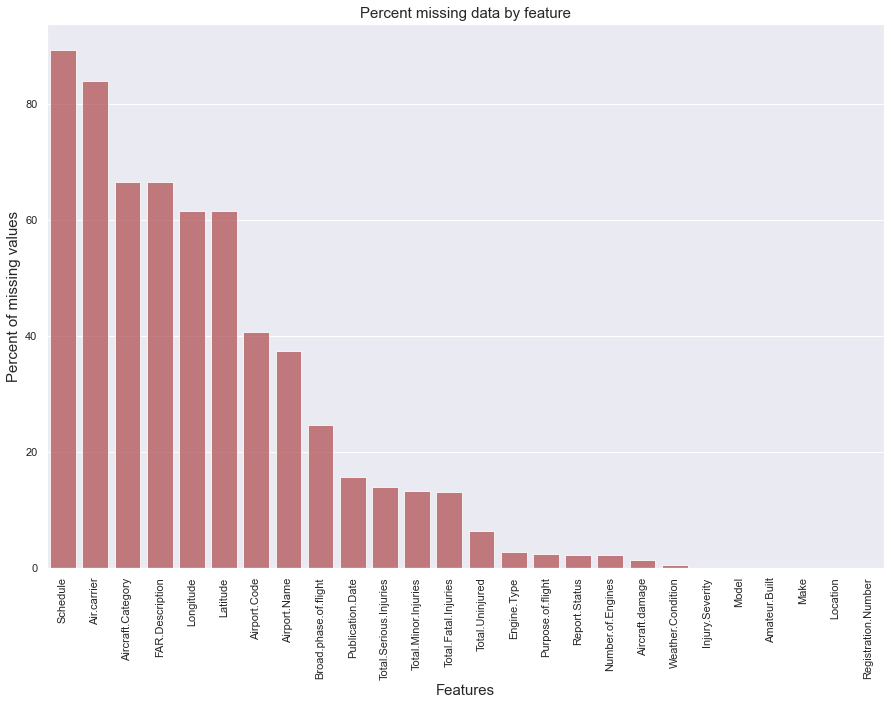

In [9]:
## Find out the amount of missing data for each col in the dataset

def missingData(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    md = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    md = md[md["Percent"] > 0]
    plt.figure(figsize = (15, 10))
    plt.xticks(rotation='90')
    sb.barplot(md.index, md["Percent"],color="r",alpha=0.8)
    plt.xlabel('Features', fontsize=15)
    plt.ylabel('Percent of missing values', fontsize=15)
    plt.title('Percent missing data by feature', fontsize=15)
    return md

missingData(data_USA)

In [10]:
wanted = ['Event.Date', 'Location', 'Latitude', 'Longitude', 'Country', 'Airport.Code', 'Airport.Name', 'Aircraft.damage', 'Aircraft.Category', 'Make', 'Number.of.Engines', 'Engine.Type', 'Weather.Condition', 'Broad.phase.of.flight',  'Total.Fatal.Injuries', 'Total.Serious.Injuries', 'Total.Minor.Injuries', 'Total.Uninjured', 'Injury.Severity']

variables = pd.DataFrame(data_USA[wanted])# Extract only the variables we need
variables.head()

,Event.Date,Location,Latitude,Longitude,Country,Airport.Code,Airport.Name,Aircraft.damage,Aircraft.Category,Make,Number.of.Engines,Engine.Type,Weather.Condition,Broad.phase.of.flight,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Injury.Severity
0,14/10/05,"BENTON, TN",36.273611,-84.558889,United States,NaN,NaN,Substantial,Glider,1200,0.0,NaN,VMC,Maneuvering,NaN,1.0,NaN,NaN,Non-Fatal
1,4/5/14,"Bluffdale, UT",402824N,1115640W,United States,NaN,NaN,Substantial,Airplane,177MF LLC,1.0,Reciprocating,VMC,NaN,0.0,2.0,0.0,0.0,Non-Fatal
2,12/5/01,"GALLUP, NM",NaN,NaN,United States,GUP,GALLUP,Substantial,NaN,1977 Colfer-chan,NaN,Reciprocating,VMC,Landing,NaN,NaN,1.0,NaN,Non-Fatal
3,8/6/94,"SALT LAKE CITY, UT",NaN,NaN,United States,NaN,NaN,Destroyed,NaN,1st Ftr Gp,1.0,Reciprocating,VMC,Maneuvering,1.0,0.0,0.0,0.0,Fatal(1)
4,22/11/00,"Fort Collins, CO",NaN,NaN,United States,NaN,NaN,Destroyed,NaN,2000 Mccoy,1.0,Reciprocating,VMC,Cruise,1.0,NaN,NaN,NaN,Fatal(1)


In [11]:
print("Data type : ", type(variables))
print("Data dims : ", variables.shape)
print(variables.dtypes)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (78669, 19)
Event.Date                 object
Location                   object
Latitude                   object
Longitude                  object
Country                    object
Airport.Code               object
Airport.Name               object
Aircraft.damage            object
Aircraft.Category          object
Make                       object
Number.of.Engines         float64
Engine.Type                object
Weather.Condition          object
Broad.phase.of.flight      object
Total.Fatal.Injuries      float64
Total.Serious.Injuries    float64
Total.Minor.Injuries      float64
Total.Uninjured           float64
Injury.Severity            object
dtype: object


In [12]:
# Changing the fatal column to 'Non-Fatal', 'None', 'Fatal', or 'Unknown', and adding a 'Fatal_Count' in a separate column
import re

fatal_counts = []
fatal_bools = []
for i in range(len(variables)):
    fatal_resp = variables.iloc[i]['Injury.Severity']
    if str(fatal_resp) == 'Non-Fatal':
        fatal_counts.append(0)
        fatal_bools.append("Non-Fatal")
    elif fatal_resp is not None:    
        num = re.sub(r'\D', "", str(fatal_resp))        
        if num == "":
            fatal_counts.append(0)
            fatal_bools.append("Not Reported")
        else:
            fatal_counts.append(int(num))
            fatal_bools.append("Fatal")
    else:
        fatal_counts.append(0)
        fatal_bools.append("Not Reported")
    
variables['Fatal.Count'] = fatal_counts
variables['Fatal.Cat'] = fatal_bools

variables

,Event.Date,Location,Latitude,Longitude,Country,Airport.Code,Airport.Name,Aircraft.damage,Aircraft.Category,Make,...,Engine.Type,Weather.Condition,Broad.phase.of.flight,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Injury.Severity,Fatal.Count,Fatal.Cat
0,14/10/05,"BENTON, TN",36.273611,-84.558889,United States,NaN,NaN,Substantial,Glider,1200,...,NaN,VMC,Maneuvering,NaN,1.0,NaN,NaN,Non-Fatal,0,Non-Fatal
1,4/5/14,"Bluffdale, UT",402824N,1115640W,United States,NaN,NaN,Substantial,Airplane,177MF LLC,...,Reciprocating,VMC,NaN,0.0,2.0,0.0,0.0,Non-Fatal,0,Non-Fatal
2,12/5/01,"GALLUP, NM",NaN,NaN,United States,GUP,GALLUP,Substantial,NaN,1977 Colfer-chan,...,Reciprocating,VMC,Landing,NaN,NaN,1.0,NaN,Non-Fatal,0,Non-Fatal
3,8/6/94,"SALT LAKE CITY, UT",NaN,NaN,United States,NaN,NaN,Destroyed,NaN,1st Ftr Gp,...,Reciprocating,VMC,Maneuvering,1.0,0.0,0.0,0.0,Fatal(1),1,Fatal
4,22/11/00,"Fort Collins, CO",NaN,NaN,United States,NaN,NaN,Destroyed,NaN,2000 Mccoy,...,Reciprocating,VMC,Cruise,1.0,NaN,NaN,NaN,Fatal(1),1,Fatal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78664,2/11/90,"IOWA PARK, TX",NaN,NaN,United States,F14,WICHITA VALLEY,Substantial,NaN,NaN,...,Reciprocating,VMC,Takeoff,0.0,0.0,0.0,1.0,Non-Fatal,0,Non-Fatal
78665,25/8/01,"BONNEY LAKE, WA",NaN,NaN,United States,NaN,NaN,Substantial,NaN,NaN,...,Reciprocating,VMC,Descent,NaN,NaN,NaN,1.0,Non-Fatal,0,Non-Fatal
78666,2/8/03,"Elbow Lake, MN",45.986111,-95.991944,United States,NaN,NaN,Destroyed,NaN,NaN,...,Reciprocating,IMC,Cruise,1.0,NaN,NaN,NaN,Fatal(1),1,Fatal
78667,2/9/07,"DAYTONA BEACH, FL",29.080278,-81.046666,United States,7FL6,Spruce Creek Airport,Substantial,NaN,NaN,...,NaN,VMC,Takeoff,0.0,0.0,0.0,2.0,Non-Fatal,0,Non-Fatal


In [13]:
## Get rid of the data with blanks
variables['Make'].dropna()

## Get the company name (consistent)
Make = variables["Make"]

company = Make.str.upper()
variables["Make"] = company

splitMake = Make.str.split(" " ,expand=True)
print(splitMake[0])


##company = splitMake[0].str.upper()
##variables["Make"] = company
##variables

0         1200
1        177MF
2         1977
3          1ST
4         2000
         ...  
78664      NaN
78665      NaN
78666      NaN
78667      NaN
78668      NaN
Name: 0, Length: 78669, dtype: object


In [14]:
for col in variables:
    #sub_df = variables.dropna(subset = [col])
    print("-------------------------------------------")
    print(col)
    print("Possible Response")
    print()
    print(variables[col].value_counts())
    print()
    print("Number of responses: " + str(len(variables[col])))
    print("-------------------------------------------")
    print()

-------------------------------------------
Event.Date
Possible Response

30/6/84    25
16/5/82    25
5/6/83     24
5/8/83     24
21/7/01    23
           ..
23/1/18     1
17/4/16     1
13/4/21     1
10/3/13     1
6/1/05      1
Name: Event.Date, Length: 14247, dtype: int64

Number of responses: 78669
-------------------------------------------

-------------------------------------------
Location
Possible Response

ANCHORAGE, AK          405
ALBUQUERQUE, NM        192
HOUSTON, TX            174
FAIRBANKS, AK          169
MIAMI, FL              158
                      ... 
Nashville, PA            1
CANDLEWOOD LAKE, CT      1
NEAR IRWIN, ID           1
JOLIET, MT               1
SCAGGS ISLAND, CA        1
Name: Location, Length: 22583, dtype: int64

Number of responses: 78669
-------------------------------------------

-------------------------------------------
Latitude
Possible Response

332739N      19
335219N      18
32.815556    17
324934N      16
34.654444    15
             ..

Non-Fatal      63794
Fatal(1)        5852
Fatal(2)        3445
Fatal           3351
Fatal(3)        1017
Fatal(4)         709
Fatal(5)         176
Fatal(6)         115
Fatal(7)          37
Fatal(8)          29
Fatal(10)         17
Unavailable       15
Fatal(9)           8
Fatal(14)          6
Fatal(11)          5
Fatal(12)          5
Fatal(13)          3
Fatal(17)          3
Fatal(18)          3
Fatal(25)          3
Fatal(34)          2
Fatal(23)          2
Fatal(82)          2
Fatal(20)          2
Fatal(37)          1
Fatal(230)         1
Fatal(92)          1
Fatal(70)          1
Fatal(111)         1
Fatal(16)          1
Fatal(88)          1
Fatal(156)         1
Fatal(228)         1
Fatal(78)          1
Fatal(135)         1
Fatal(132)         1
Fatal(153)         1
Fatal(21)          1
Fatal(49)          1
Fatal(65)          1
Fatal(73)          1
Fatal(19)          1
Fatal(44)          1
Fatal(64)          1
Fatal(265)         1
Fatal(28)          1
Fatal(27)          1
Fatal(31)    

In [15]:
## Remove those with only 1 accident record to have more appropriate comparison
variables = variables[variables.groupby('Make').Make.transform('count') > 1]

## Get the top 10 companies with the highest accident records
for col in variables:
    #sub_df = variables.dropna(subset = [col])
    print("-------------------------------------------")
    print(col)
    print("Possible Response")
    print()
    print(variables[col].value_counts().head(10))
    print()
    print("Number of responses: " + str(len(variables[col])))
    print("-------------------------------------------")
    print()

-------------------------------------------
Event.Date
Possible Response

5/8/83     24
16/5/82    24
5/6/83     23
21/7/01    23
30/6/84    23
9/7/82     22
8/7/00     22
28/5/83    22
1/5/82     22
17/5/86    22
Name: Event.Date, dtype: int64

Number of responses: 72817
-------------------------------------------

-------------------------------------------
Location
Possible Response

ANCHORAGE, AK      399
ALBUQUERQUE, NM    178
HOUSTON, TX        171
FAIRBANKS, AK      165
MIAMI, FL          153
TUCSON, AZ         129
ENGLEWOOD, CO      127
PHOENIX, AZ        123
ORLANDO, FL        114
SAN DIEGO, CA      109
Name: Location, dtype: int64

Number of responses: 72817
-------------------------------------------

-------------------------------------------
Latitude
Possible Response

332739N      18
335219N      18
32.815556    16
34.654444    15
324934N      15
334118N      15
61.213611    13
335232N      13
33.460833    13
26.197222    13
Name: Latitude, dtype: int64

Number of respon

In [16]:
companies = ["CESSNA", "PIPER", "BEECH", "BELL", "BOEING", "MOONEY", "ROBINSON", "GRUMMAN", "BELLANCA", "HUGHES"]
index_list = []
for index, row in variables.iterrows():
    #print(row["Make"])
     if(row['Make'] not in companies):
            index_list.append(index)
variables = variables.drop(index_list)
variables.reset_index(drop=True, inplace=True)
variables

,Event.Date,Location,Latitude,Longitude,Country,Airport.Code,Airport.Name,Aircraft.damage,Aircraft.Category,Make,...,Engine.Type,Weather.Condition,Broad.phase.of.flight,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Injury.Severity,Fatal.Count,Fatal.Cat
0,1/1/82,"TUSKEGEE, AL",NaN,NaN,United States,NaN,TUSKEGEE,Substantial,NaN,BEECH,...,Reciprocating,VMC,Landing,0.0,0.0,0.0,1.0,Non-Fatal,0,Non-Fatal
1,2/1/82,"LITTLE ROCK, AR",NaN,NaN,United States,NaN,NaN,Destroyed,Airplane,BEECH,...,Reciprocating,IMC,Cruise,2.0,0.0,0.0,0.0,Fatal(2),2,Fatal
2,6/1/82,"JACKSON, WY",NaN,NaN,United States,NaN,JACKSON HOLE,Substantial,Airplane,BEECH,...,Reciprocating,VMC,Climb,0.0,0.0,0.0,3.0,Non-Fatal,0,Non-Fatal
3,7/1/82,"WESTMINISTER, MD",NaN,NaN,United States,2W2,CLEARVIEW,Substantial,Airplane,BEECH,...,Reciprocating,VMC,Approach,0.0,0.0,0.0,1.0,Non-Fatal,0,Non-Fatal
4,12/1/82,"ADDISON, TX",NaN,NaN,United States,11,ADDISON,Substantial,Airplane,BEECH,...,Reciprocating,IMC,Descent,0.0,1.0,0.0,1.0,Non-Fatal,0,Non-Fatal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52230,18/11/20,"Austell, GA",033505N,0843928W,United States,NaN,NONE,Substantial,Helicopter,ROBINSON,...,Reciprocating,VMC,NaN,0.0,0.0,0.0,2.0,Non-Fatal,0,Non-Fatal
52231,10/12/20,"Colorado City, TX",321856N,1005650W,United States,NaN,NaN,Destroyed,Helicopter,ROBINSON,...,NaN,VMC,NaN,2.0,0.0,0.0,0.0,Fatal,0,Not Reported
52232,26/1/21,"West Palm Beach, FL",263535N,0008056W,United States,LNA,Palm Beach County Park Airport,Substantial,Helicopter,ROBINSON,...,Reciprocating,VMC,NaN,0.0,0.0,0.0,2.0,Non-Fatal,0,Non-Fatal
52233,19/7/21,"Elgin, MN",044629N,0921215W,United States,NaN,NaN,Destroyed,Helicopter,ROBINSON,...,NaN,VMC,NaN,1.0,0.0,0.0,0.0,Fatal,0,Not Reported


In [17]:
variables["Make"].describe()

count      52235
unique        10
top       CESSNA
freq       25267
Name: Make, dtype: object

In [18]:
#Seperate the passengers & crew into 3 category = Fatal, Uninjured, Injured
#Remove rows with missing passengers & crew information (i.e. Fatal + Uninjuried + Injuried = 0)
for i in ["Total.Fatal.Injuries","Total.Serious.Injuries","Total.Minor.Injuries","Total.Uninjured"]:
    variables[i].fillna(value = 0.0, inplace = True)
variables["Fatal"] = variables.apply(lambda x: x["Total.Fatal.Injuries"], axis=1)
variables["Injured"] = variables.apply(lambda x: x["Total.Serious.Injuries"] + x["Total.Minor.Injuries"], axis=1)
variables["Uninjured"] = variables.apply(lambda x: x["Total.Uninjured"], axis=1)
variables = variables.drop(columns=['Total.Fatal.Injuries','Total.Serious.Injuries','Total.Minor.Injuries','Total.Uninjured'])

print(variables['Fatal'].value_counts(), end = '\n\n')
print(variables['Injured'].value_counts(), end = '\n\n')
print(variables['Uninjured'].value_counts(), end = '\n\n')
variables

0.0      42853
1.0       4335
2.0       2926
3.0       1023
4.0        715
5.0        186
6.0         96
7.0         28
8.0         22
10.0        13
9.0          6
14.0         5
11.0         4
12.0         2
17.0         2
18.0         2
25.0         2
82.0         1
92.0         1
13.0         1
78.0         1
21.0         1
153.0        1
20.0         1
132.0        1
73.0         1
230.0        1
64.0         1
34.0         1
44.0         1
228.0        1
65.0         1
Name: Fatal, dtype: int64

0.0      37831
1.0       8104
2.0       4266
3.0       1082
4.0        625
5.0        135
6.0         70
7.0         35
8.0         15
9.0         12
12.0        11
11.0         5
10.0         4
13.0         4
22.0         3
17.0         2
30.0         2
23.0         2
21.0         2
20.0         2
36.0         2
15.0         2
26.0         2
38.0         1
64.0         1
24.0         1
76.0         1
44.0         1
133.0        1
34.0         1
47.0         1
40.0         1
19.0         

,Event.Date,Location,Latitude,Longitude,Country,Airport.Code,Airport.Name,Aircraft.damage,Aircraft.Category,Make,Number.of.Engines,Engine.Type,Weather.Condition,Broad.phase.of.flight,Injury.Severity,Fatal.Count,Fatal.Cat,Fatal,Injured,Uninjured
0,1/1/82,"TUSKEGEE, AL",NaN,NaN,United States,NaN,TUSKEGEE,Substantial,NaN,BEECH,1.0,Reciprocating,VMC,Landing,Non-Fatal,0,Non-Fatal,0.0,0.0,1.0
1,2/1/82,"LITTLE ROCK, AR",NaN,NaN,United States,NaN,NaN,Destroyed,Airplane,BEECH,1.0,Reciprocating,IMC,Cruise,Fatal(2),2,Fatal,2.0,0.0,0.0
2,6/1/82,"JACKSON, WY",NaN,NaN,United States,NaN,JACKSON HOLE,Substantial,Airplane,BEECH,1.0,Reciprocating,VMC,Climb,Non-Fatal,0,Non-Fatal,0.0,0.0,3.0
3,7/1/82,"WESTMINISTER, MD",NaN,NaN,United States,2W2,CLEARVIEW,Substantial,Airplane,BEECH,1.0,Reciprocating,VMC,Approach,Non-Fatal,0,Non-Fatal,0.0,0.0,1.0
4,12/1/82,"ADDISON, TX",NaN,NaN,United States,11,ADDISON,Substantial,Airplane,BEECH,1.0,Reciprocating,IMC,Descent,Non-Fatal,0,Non-Fatal,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52230,18/11/20,"Austell, GA",033505N,0843928W,United States,NaN,NONE,Substantial,Helicopter,ROBINSON,1.0,Reciprocating,VMC,NaN,Non-Fatal,0,Non-Fatal,0.0,0.0,2.0
52231,10/12/20,"Colorado City, TX",321856N,1005650W,United States,NaN,NaN,Destroyed,Helicopter,ROBINSON,1.0,NaN,VMC,NaN,Fatal,0,Not Reported,2.0,0.0,0.0
52232,26/1/21,"West Palm Beach, FL",263535N,0008056W,United States,LNA,Palm Beach County Park Airport,Substantial,Helicopter,ROBINSON,1.0,Reciprocating,VMC,NaN,Non-Fatal,0,Non-Fatal,0.0,0.0,2.0
52233,19/7/21,"Elgin, MN",044629N,0921215W,United States,NaN,NaN,Destroyed,Helicopter,ROBINSON,1.0,NaN,VMC,NaN,Fatal,0,Not Reported,1.0,0.0,0.0


Non-Fatal       42814
Fatal            9382
Not Reported       39
Name: Fatal.Cat, dtype: int64


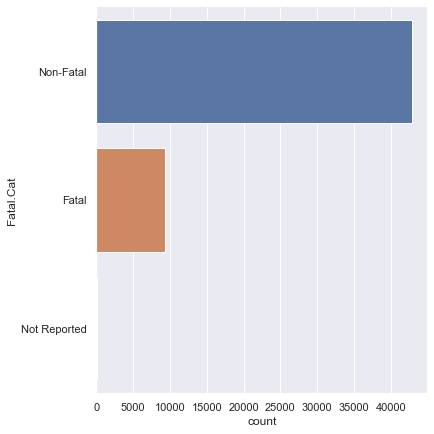

In [19]:
fatal_cat = []
for index, row in variables.iterrows():
    if(row["Fatal"] == 0.0 and row["Injured"] == 0.0 and row["Uninjured"] == 0.0):
        fatal_cat.append('Not Reported')
    
    elif(row["Fatal"] != 0.0):
        fatal_cat.append("Fatal")
    
    else:
        fatal_cat.append("Non-Fatal")
    
variables["Fatal.Cat"] = fatal_cat

# Each Type
print(variables["Fatal.Cat"].value_counts())
sb.catplot(y = "Fatal.Cat", data = variables, kind = "count", height = 6)

VMC    47205
IMC     4329
Unk       64
Name: Weather.Condition, dtype: int64


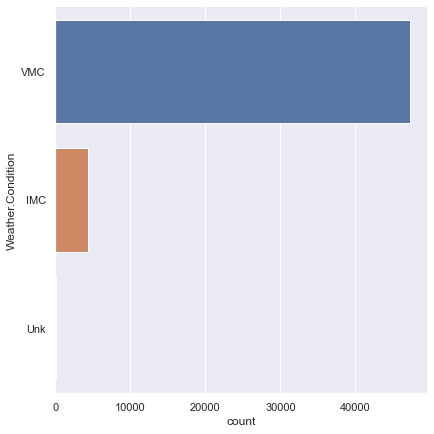

In [20]:
variables['Weather.Condition'].fillna(value = 'UNK', inplace = True)
variables = pd.DataFrame(variables[~variables['Weather.Condition'].str.match('UNK')])

# Each Type
print(variables["Weather.Condition"].value_counts())
sb.catplot(y = "Weather.Condition", data = variables, kind = "count", height = 6)

Landing        11252
Takeoff         8072
Cruise          7048
Maneuvering     4729
Approach        4429
Taxi            1319
Climb           1273
Descent         1271
Go-around       1117
Standing         566
Name: Broad.phase.of.flight, dtype: int64


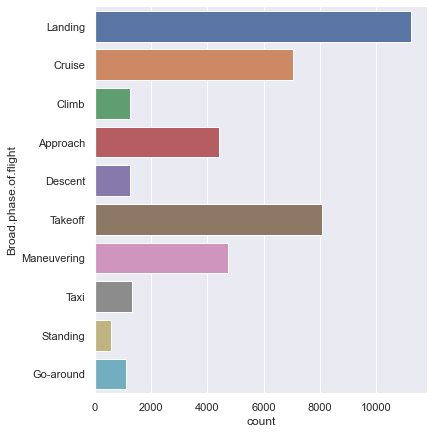

In [21]:
#Remove rows with missing phase of flight
variables['Broad.phase.of.flight'].fillna(value = 'Unknown', inplace = True)
variables['Broad.phase.of.flight'].mask(variables['Broad.phase.of.flight'] == 'Other', 'Unknown', inplace=True)
variables = pd.DataFrame(variables[~variables['Broad.phase.of.flight'].str.match('Unknown')])

# Each Type
print(variables["Broad.phase.of.flight"].value_counts())
sb.catplot(y = "Broad.phase.of.flight", data = variables, kind = "count", height = 6)

Reciprocating    38413
Turbo Shaft       1468
Turbo Prop         680
Turbo Fan          380
Turbo Jet          101
Name: Engine.Type, dtype: int64


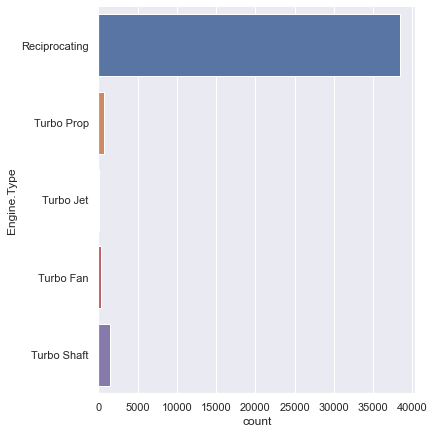

In [22]:
#Remove rows with missing engine type
variables['Engine.Type'].fillna(value = 'None', inplace = True)
variables = pd.DataFrame(variables[~variables['Engine.Type'].str.match('None')])
variables = pd.DataFrame(variables[~variables['Engine.Type'].str.match('Unknown')])
print(variables['Engine.Type'].value_counts())

# Each Type
sb.catplot(y = "Engine.Type", data = variables, kind = "count", height = 6)

Substantial    30915
Destroyed       9572
Minor            241
Name: Aircraft.damage, dtype: int64


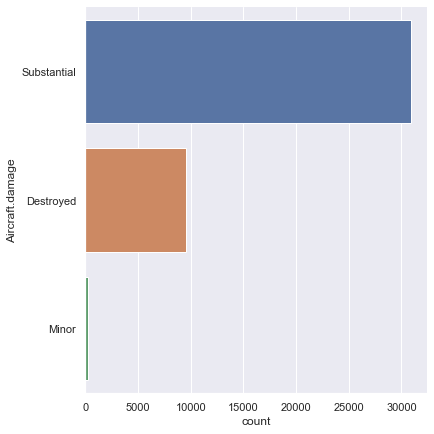

In [23]:
#Remove Aircraft Damage Nan
variables['Aircraft.damage'].fillna(value = 'Unknown', inplace = True)
variables = pd.DataFrame(variables[~variables['Aircraft.damage'].str.contains('Unknown')])
print(variables['Aircraft.damage'].value_counts())

# Each Type
sb.catplot(y = "Aircraft.damage", data = variables, kind = "count", height = 6)

1    35787
2     4792
3       54
4       48
Name: Number.of.Engines, dtype: int64


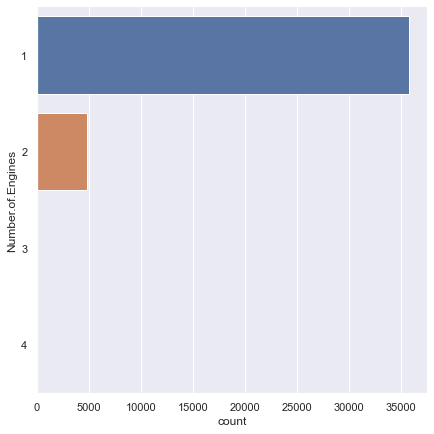

In [24]:
#Remove rows with missing injuries
variables['Number.of.Engines'].fillna(value = 'None', inplace = True)
variables['Number.of.Engines'] = variables['Number.of.Engines'].replace(to_replace='None', value=0.0)
variables['Number.of.Engines'] = variables['Number.of.Engines'].astype('int')
#variables['Number.of.Engines'] = variables['Number.of.Engines'].dropna()

variables = variables[variables['Number.of.Engines'] != 0]

print(variables['Number.of.Engines'].value_counts())
#print(variables['Number.of.Engines'].isnull().sum())

# Each Type
sb.catplot(y = "Number.of.Engines", data = variables, kind = "count", height = 6)

In [25]:
#Remove rows with missing incident location
df_map = pd.DataFrame()
variables['Latitude'].fillna(value = 0.0, inplace = True)
df_map = variables[variables['Latitude'] != 0]

variables['Longitude'].fillna(value = 0.0, inplace = True)
df_map = variables[variables['Longitude'] != 0]

# print(df_map['Latitude'].value_counts(), end = '\n\n')
# print(df_map['Longitude'].value_counts(), end = '\n\n')

map_df = pd.DataFrame()
map_df['Latitude'] = df_map['Latitude']
map_df['Longitude'] = df_map ['Longitude']

map_df.reset_index(drop=True)
print(map_df)
map_df.info()

        Latitude    Longitude
41     30.757778   -88.355555
2941     33.7825   -83.692777
2963   40.820556   -76.863889
2965   33.866667  -117.966667
2974   35.666667  -117.666667
...          ...          ...
52049  53.353333      -168.24
52050  43.778889  -116.938611
52051  33.039166     -116.915
52052      36.88   -76.214167
52053  38.288889  -104.484444

[6870 rows x 2 columns]
<class 'pandas.core.frame.DataFrame'>
Int64Index: 6870 entries, 41 to 52053
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Latitude   6870 non-null   object
 1   Longitude  6870 non-null   object
dtypes: object(2)
memory usage: 161.0+ KB


/Users/ester/opt/anaconda3/lib/python3.8/site-packages/pandas/core/series.py:4463: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


In [26]:
variables.reset_index(drop = True)

,Event.Date,Location,Latitude,Longitude,Country,Airport.Code,Airport.Name,Aircraft.damage,Aircraft.Category,Make,Number.of.Engines,Engine.Type,Weather.Condition,Broad.phase.of.flight,Injury.Severity,Fatal.Count,Fatal.Cat,Fatal,Injured,Uninjured
0,1/1/82,"TUSKEGEE, AL",0.0,0.0,United States,NaN,TUSKEGEE,Substantial,NaN,BEECH,1,Reciprocating,VMC,Landing,Non-Fatal,0,Non-Fatal,0.0,0.0,1.0
1,2/1/82,"LITTLE ROCK, AR",0.0,0.0,United States,NaN,NaN,Destroyed,Airplane,BEECH,1,Reciprocating,IMC,Cruise,Fatal(2),2,Fatal,2.0,0.0,0.0
2,6/1/82,"JACKSON, WY",0.0,0.0,United States,NaN,JACKSON HOLE,Substantial,Airplane,BEECH,1,Reciprocating,VMC,Climb,Non-Fatal,0,Non-Fatal,0.0,0.0,3.0
3,7/1/82,"WESTMINISTER, MD",0.0,0.0,United States,2W2,CLEARVIEW,Substantial,Airplane,BEECH,1,Reciprocating,VMC,Approach,Non-Fatal,0,Non-Fatal,0.0,0.0,1.0
4,12/1/82,"ADDISON, TX",0.0,0.0,United States,11,ADDISON,Substantial,Airplane,BEECH,1,Reciprocating,IMC,Descent,Non-Fatal,0,Non-Fatal,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40676,29/10/07,"NIKOLSKI, AK",53.353333,-168.24,United States,NaN,NaN,Substantial,Helicopter,ROBINSON,1,Reciprocating,VMC,Maneuvering,Non-Fatal,0,Non-Fatal,0.0,0.0,1.0
40677,3/11/07,"PARMA, ID",43.778889,-116.938611,United States,50S,Parma,Substantial,Helicopter,ROBINSON,1,Reciprocating,VMC,Landing,Non-Fatal,0,Non-Fatal,0.0,0.0,2.0
40678,20/11/07,"RAMONA, CA",33.039166,-116.915,United States,RMN,Ramona Airport,Substantial,Helicopter,ROBINSON,1,Reciprocating,VMC,Landing,Non-Fatal,0,Non-Fatal,0.0,1.0,1.0
40679,24/11/07,"SUFFOLK, VA",36.88,-76.214167,United States,NaN,NaN,Substantial,Helicopter,ROBINSON,1,Reciprocating,VMC,Maneuvering,Non-Fatal,0,Non-Fatal,0.0,0.0,1.0


In [27]:
variables["Engine.Type"].value_counts()

Reciprocating    38250
Turbo Shaft       1443
Turbo Prop         672
Turbo Fan          243
Turbo Jet           73
Name: Engine.Type, dtype: int64

In [28]:
# Separating the date column into year, month, day
variables['Day'], variables['Month'], variables['Year'] = zip(*variables['Event.Date'].map(lambda x: str(x).split('/')))

display(variables.head(10))

<ipython-input-28-b0c135bb10ef>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  variables['Day'], variables['Month'], variables['Year'] = zip(*variables['Event.Date'].map(lambda x: str(x).split('/')))


,Event.Date,Location,Latitude,Longitude,Country,Airport.Code,Airport.Name,Aircraft.damage,Aircraft.Category,Make,...,Broad.phase.of.flight,Injury.Severity,Fatal.Count,Fatal.Cat,Fatal,Injured,Uninjured,Day,Month,Year
0,1/1/82,"TUSKEGEE, AL",0.0,0.0,United States,NaN,TUSKEGEE,Substantial,NaN,BEECH,...,Landing,Non-Fatal,0,Non-Fatal,0.0,0.0,1.0,1,1,82
1,2/1/82,"LITTLE ROCK, AR",0.0,0.0,United States,NaN,NaN,Destroyed,Airplane,BEECH,...,Cruise,Fatal(2),2,Fatal,2.0,0.0,0.0,2,1,82
2,6/1/82,"JACKSON, WY",0.0,0.0,United States,NaN,JACKSON HOLE,Substantial,Airplane,BEECH,...,Climb,Non-Fatal,0,Non-Fatal,0.0,0.0,3.0,6,1,82
3,7/1/82,"WESTMINISTER, MD",0.0,0.0,United States,2W2,CLEARVIEW,Substantial,Airplane,BEECH,...,Approach,Non-Fatal,0,Non-Fatal,0.0,0.0,1.0,7,1,82
4,12/1/82,"ADDISON, TX",0.0,0.0,United States,11,ADDISON,Substantial,Airplane,BEECH,...,Descent,Non-Fatal,0,Non-Fatal,0.0,1.0,1.0,12,1,82
5,13/1/82,"HOBBS, NM",0.0,0.0,United States,HOB,LEA COUNTY HOBBS,Substantial,Airplane,BEECH,...,Takeoff,Non-Fatal,0,Non-Fatal,0.0,0.0,4.0,13,1,82
6,15/1/82,"ANOKA, MN",0.0,0.0,United States,ANE,ANOKA COUNTY,Substantial,Airplane,BEECH,...,Landing,Non-Fatal,0,Non-Fatal,0.0,0.0,2.0,15,1,82
7,17/1/82,"PICAYUNE, MS",0.0,0.0,United States,PCU,PICAYUNE-PEARL RIVER CNTY,Destroyed,Airplane,BEECH,...,Takeoff,Fatal(2),2,Fatal,2.0,0.0,0.0,17,1,82
8,18/1/82,"ORCHARDS, WA",0.0,0.0,United States,NaN,CLARK COUNTY,Destroyed,Airplane,BEECH,...,Descent,Non-Fatal,0,Non-Fatal,0.0,4.0,0.0,18,1,82
9,19/1/82,"STILLWATER, OK",0.0,0.0,United States,SWO,STILLWATER MUNICIPAL,Destroyed,Airplane,BEECH,...,Maneuvering,Fatal(2),2,Fatal,2.0,0.0,0.0,19,1,82


In [29]:
## Modify the year to a full format for easy viz
year = []
for index, row in variables.iterrows():
    if(int(row['Year']) < 22):
        year.append('20' + row['Year'])
    
    else:
        year.append('19' + row['Year'])

variables['Year'] = year
variables

<ipython-input-29-605041f4961f>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  variables['Year'] = year


,Event.Date,Location,Latitude,Longitude,Country,Airport.Code,Airport.Name,Aircraft.damage,Aircraft.Category,Make,...,Broad.phase.of.flight,Injury.Severity,Fatal.Count,Fatal.Cat,Fatal,Injured,Uninjured,Day,Month,Year
0,1/1/82,"TUSKEGEE, AL",0.0,0.0,United States,NaN,TUSKEGEE,Substantial,NaN,BEECH,...,Landing,Non-Fatal,0,Non-Fatal,0.0,0.0,1.0,1,1,1982
1,2/1/82,"LITTLE ROCK, AR",0.0,0.0,United States,NaN,NaN,Destroyed,Airplane,BEECH,...,Cruise,Fatal(2),2,Fatal,2.0,0.0,0.0,2,1,1982
2,6/1/82,"JACKSON, WY",0.0,0.0,United States,NaN,JACKSON HOLE,Substantial,Airplane,BEECH,...,Climb,Non-Fatal,0,Non-Fatal,0.0,0.0,3.0,6,1,1982
3,7/1/82,"WESTMINISTER, MD",0.0,0.0,United States,2W2,CLEARVIEW,Substantial,Airplane,BEECH,...,Approach,Non-Fatal,0,Non-Fatal,0.0,0.0,1.0,7,1,1982
4,12/1/82,"ADDISON, TX",0.0,0.0,United States,11,ADDISON,Substantial,Airplane,BEECH,...,Descent,Non-Fatal,0,Non-Fatal,0.0,1.0,1.0,12,1,1982
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52049,29/10/07,"NIKOLSKI, AK",53.353333,-168.24,United States,NaN,NaN,Substantial,Helicopter,ROBINSON,...,Maneuvering,Non-Fatal,0,Non-Fatal,0.0,0.0,1.0,29,10,2007
52050,3/11/07,"PARMA, ID",43.778889,-116.938611,United States,50S,Parma,Substantial,Helicopter,ROBINSON,...,Landing,Non-Fatal,0,Non-Fatal,0.0,0.0,2.0,3,11,2007
52051,20/11/07,"RAMONA, CA",33.039166,-116.915,United States,RMN,Ramona Airport,Substantial,Helicopter,ROBINSON,...,Landing,Non-Fatal,0,Non-Fatal,0.0,1.0,1.0,20,11,2007
52052,24/11/07,"SUFFOLK, VA",36.88,-76.214167,United States,NaN,NaN,Substantial,Helicopter,ROBINSON,...,Maneuvering,Non-Fatal,0,Non-Fatal,0.0,0.0,1.0,24,11,2007


In [30]:
variables['Year'].value_counts()

1982    2572
1983    2421
1984    2376
1985    2215
1986    1983
1987    1978
1988    1838
1989    1742
1990    1704
1991    1688
1992    1549
1993    1515
1995    1478
1994    1429
1996    1352
1999    1325
1997    1316
1998    1302
2000    1233
2003    1180
2002    1172
2001    1156
2005    1101
2004    1072
2007    1005
2006     978
1974       1
Name: Year, dtype: int64

In [31]:
##Remove 1974, only got 1 account
variables = variables[variables['Year'] != "1974"]
variables['Year'].value_counts()

1982    2572
1983    2421
1984    2376
1985    2215
1986    1983
1987    1978
1988    1838
1989    1742
1990    1704
1991    1688
1992    1549
1993    1515
1995    1478
1994    1429
1996    1352
1999    1325
1997    1316
1998    1302
2000    1233
2003    1180
2002    1172
2001    1156
2005    1101
2004    1072
2007    1005
2006     978
Name: Year, dtype: int64

In [32]:
variables.to_csv('Data/1. Data Cleaning.csv')

# Exploratory Data Analysis 
---
Using different plots and viz to display the relationship between variables

In [33]:
mainvar = ['Day', 'Month', 'Year', 'Make', 'Aircraft.damage', 'Aircraft.Category', 'Number.of.Engines', 'Engine.Type', 'Weather.Condition', 'Broad.phase.of.flight', 'Fatal', 'Injured', 'Uninjured', 'Fatal.Cat', 'Fatal.Count', 'Latitude', 'Longitude']
df = pd.DataFrame(variables[mainvar])# Extract only the variables we need
df

,Day,Month,Year,Make,Aircraft.damage,Aircraft.Category,Number.of.Engines,Engine.Type,Weather.Condition,Broad.phase.of.flight,Fatal,Injured,Uninjured,Fatal.Cat,Fatal.Count,Latitude,Longitude
0,1,1,1982,BEECH,Substantial,NaN,1,Reciprocating,VMC,Landing,0.0,0.0,1.0,Non-Fatal,0,0.0,0.0
1,2,1,1982,BEECH,Destroyed,Airplane,1,Reciprocating,IMC,Cruise,2.0,0.0,0.0,Fatal,2,0.0,0.0
2,6,1,1982,BEECH,Substantial,Airplane,1,Reciprocating,VMC,Climb,0.0,0.0,3.0,Non-Fatal,0,0.0,0.0
3,7,1,1982,BEECH,Substantial,Airplane,1,Reciprocating,VMC,Approach,0.0,0.0,1.0,Non-Fatal,0,0.0,0.0
4,12,1,1982,BEECH,Substantial,Airplane,1,Reciprocating,IMC,Descent,0.0,1.0,1.0,Non-Fatal,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52049,29,10,2007,ROBINSON,Substantial,Helicopter,1,Reciprocating,VMC,Maneuvering,0.0,0.0,1.0,Non-Fatal,0,53.353333,-168.24
52050,3,11,2007,ROBINSON,Substantial,Helicopter,1,Reciprocating,VMC,Landing,0.0,0.0,2.0,Non-Fatal,0,43.778889,-116.938611
52051,20,11,2007,ROBINSON,Substantial,Helicopter,1,Reciprocating,VMC,Landing,0.0,1.0,1.0,Non-Fatal,0,33.039166,-116.915
52052,24,11,2007,ROBINSON,Substantial,Helicopter,1,Reciprocating,VMC,Maneuvering,0.0,0.0,1.0,Non-Fatal,0,36.88,-76.214167


In [34]:
print("Data type : ", type(df))
print("Data dims : ", df.shape)
print(df.dtypes)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (40680, 17)
Day                       object
Month                     object
Year                      object
Make                      object
Aircraft.damage           object
Aircraft.Category         object
Number.of.Engines          int64
Engine.Type               object
Weather.Condition         object
Broad.phase.of.flight     object
Fatal                    float64
Injured                  float64
Uninjured                float64
Fatal.Cat                 object
Fatal.Count                int64
Latitude                  object
Longitude                 object
dtype: object


In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40680 entries, 0 to 52053
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Day                    40680 non-null  object 
 1   Month                  40680 non-null  object 
 2   Year                   40680 non-null  object 
 3   Make                   40680 non-null  object 
 4   Aircraft.damage        40680 non-null  object 
 5   Aircraft.Category      4857 non-null   object 
 6   Number.of.Engines      40680 non-null  int64  
 7   Engine.Type            40680 non-null  object 
 8   Weather.Condition      40680 non-null  object 
 9   Broad.phase.of.flight  40680 non-null  object 
 10  Fatal                  40680 non-null  float64
 11  Injured                40680 non-null  float64
 12  Uninjured              40680 non-null  float64
 13  Fatal.Cat              40680 non-null  object 
 14  Fatal.Count            40680 non-null  int64  
 15  La

In [36]:
df.to_csv('Data/2. EDA.csv')

# Time-Series Plot 
Accident Count across all airline comapanies over the years

In [37]:
df_time = pd.DataFrame()
df_time['Count'] = df.groupby(['Year','Make']).size()

df_time

Count
Year Make           
1982 BEECH       237
     BELL         95
     BELLANCA     61
     BOEING       29
     CESSNA     1248
...              ...
2007 GRUMMAN      11
     HUGHES       14
     MOONEY       30
     PIPER       247
     ROBINSON     48

[260 rows x 1 columns]

1982    2572
1983    2421
1984    2376
1985    2215
1986    1983
1987    1978
1988    1838
1989    1742
1990    1704
1991    1688
1992    1549
1993    1515
1995    1478
1994    1429
1996    1352
1999    1325
1997    1316
1998    1302
2000    1233
2003    1180
2002    1172
2001    1156
2005    1101
2004    1072
2007    1005
2006     978
Name: Year, dtype: int64


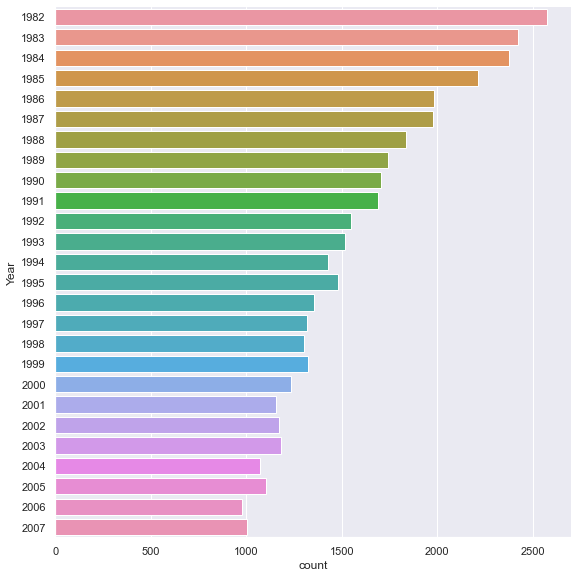

In [38]:
print(df["Year"].value_counts())
sb.catplot(y = "Year", data = df, kind = "count", height = 8)
plt.savefig('Images/CatPlot (Overall).png')

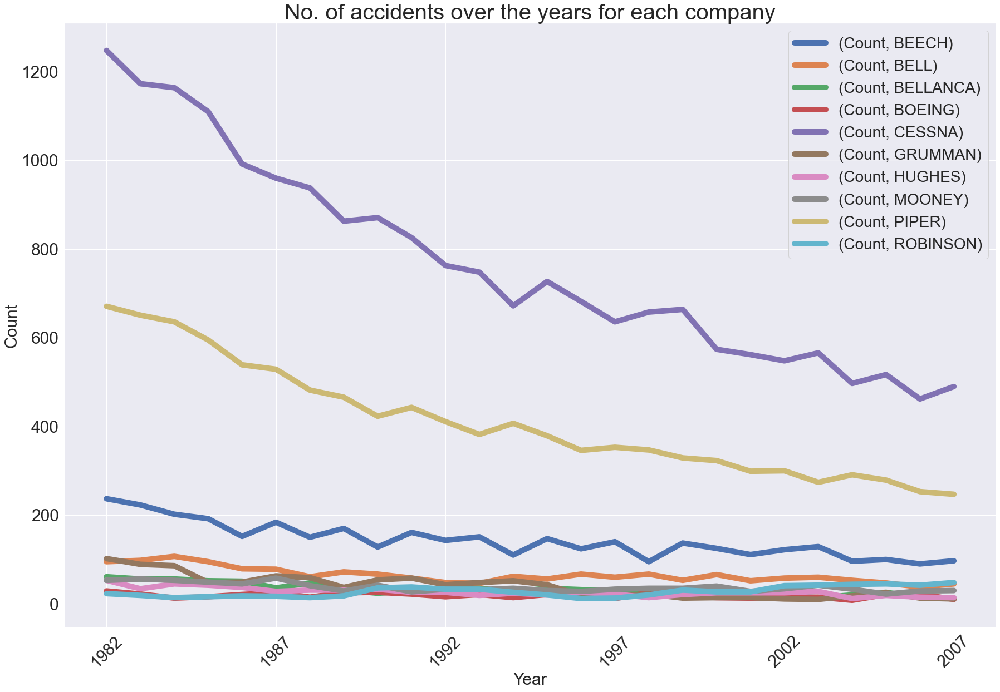

<Figure size 432x288 with 0 Axes>

In [39]:
## TIME-SERIES PLOT
df_time.unstack().plot(figsize=(30,20), linewidth=10, legend='Make')
plt.legend(fontsize = 28)
plt.xticks(rotation=45)
plt.xlabel('Year', size = 30)
plt.ylabel('Count', size = 30)
plt.title('No. of accidents over the years for each company', size = 40)
plt.xticks(size = 30)
plt.yticks(size = 30)
plt.show()
plt.savefig('Images/Time Series Plot.png')

In [40]:
yr, comp, count = [], [], []
years = list(range(1982, 2008))
companies = ["CESSNA", "PIPER", "BEECH", "BELL", "BOEING", "MOONEY", "ROBINSON", "GRUMMAN", "BELLANCA", "HUGHES"]
count = []
for item in years:
    for make in companies:
        df_year = pd.DataFrame(df[df['Year'] == str(item)])
        df_year_make = pd.DataFrame(df_year[df_year['Make'] == make])
        df_year_count = len(df_year_make)
        
        yr.append(item)
        comp.append(make)
        count.append(df_year_count)
        
df1 = pd.DataFrame()
df1['Year'] = yr
df1['Make'] = comp
df1['Count'] = count

df1       

,Year,Make,Count
0,1982,CESSNA,1248
1,1982,PIPER,671
2,1982,BEECH,237
3,1982,BELL,95
4,1982,BOEING,29
...,...,...,...
255,2007,MOONEY,30
256,2007,ROBINSON,48
257,2007,GRUMMAN,11
258,2007,BELLANCA,13


/Users/ester/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


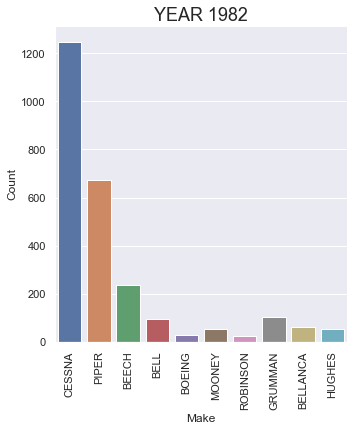

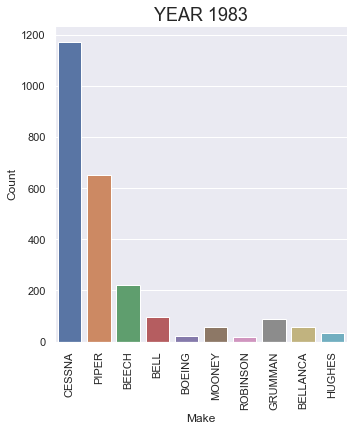

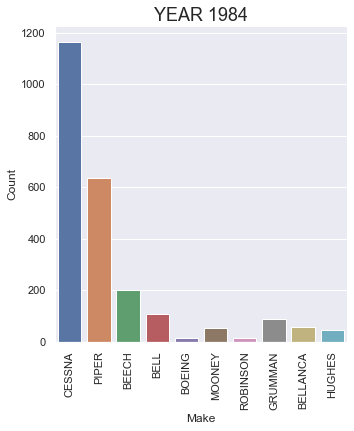

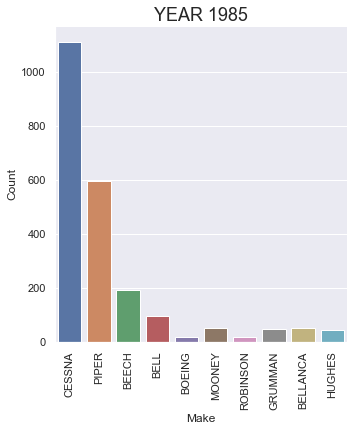

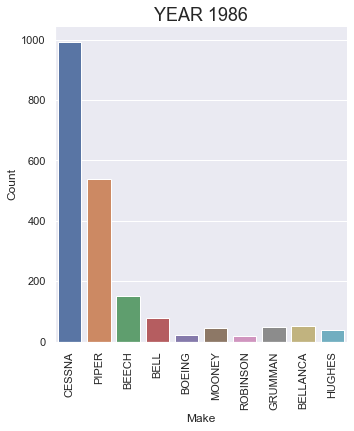

...

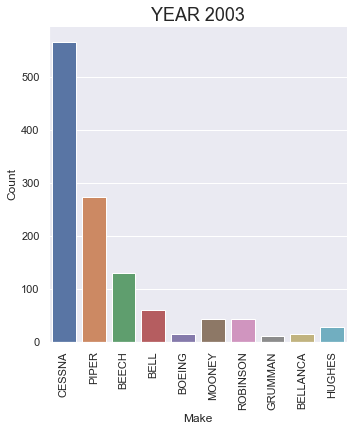

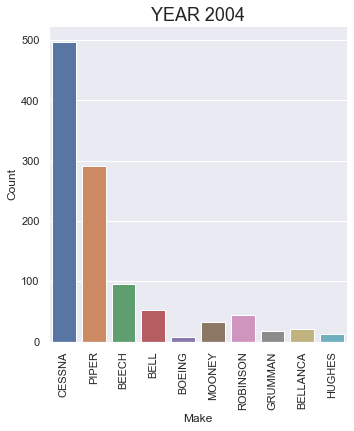

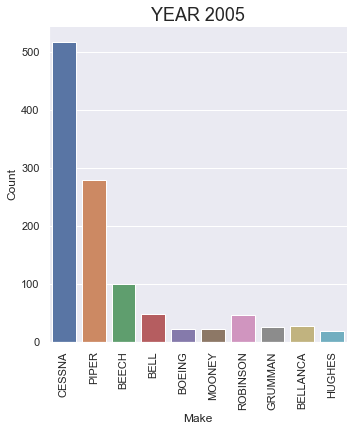

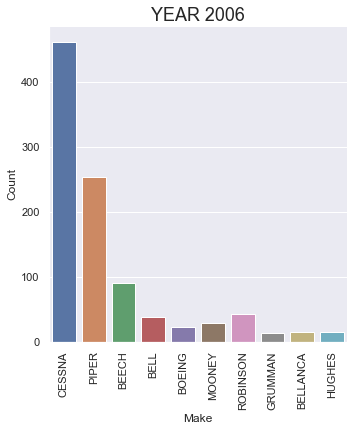

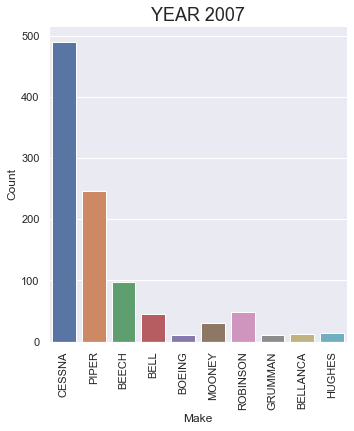

In [41]:
startYear=1982
endYear=2007

yr = list(range(startYear, endYear+1))

for i in yr:
    df_hplot = pd.DataFrame(df1[df1['Year'] == i])
    df_hplot = df_hplot.drop(columns=['Year'])
    df_hplot
    ax = sb.catplot(x="Make", y="Count", kind="bar", data=df_hplot)
    plt.title("YEAR " + str(i), fontsize=18)
    plt.xticks(rotation='90')
    plt.savefig('Images/CatPlot (Individual)/Year {}.png'.format(i))

## Fatal Count + Line Graph

In [42]:
line_1_df = df[df["Fatal.Cat"] == "Fatal"]

line_1_df
#line_1_df.reset_index(drop = True, inplace = True)


line_1 = line_1_df["Year"].value_counts().sort_index().rename_axis('Year').reset_index(name = 'Number of Fatal Accidents')
line_1.sort_values(by = ["Year"])

print("_" * 20)
print()
print("Fatal Table")
print("_" * 20)
display(line_1)

line_2_df = df[df["Fatal.Cat"] == "Non-Fatal"]

line_2_df
#line_2_df.reset_index(drop = True, inplace = True)


line_2 = line_2_df["Year"].value_counts().sort_index().rename_axis('Year').reset_index(name = 'Number of Non-Fatal Accidents')
line_2.sort_values(by = ["Year"])

print("_" * 20)
print()
print("Non-Fatal")
print("_" * 20)
display(line_2)

line_3_df = df[df["Fatal.Cat"] == "Not Reported"]

line_3_df
#line_3_df.reset_index(drop = True, inplace = True)


line_3 = line_3_df["Year"].value_counts().sort_index().rename_axis('Year').reset_index(name = 'Number of Not Reported Accidents')
line_3.sort_values(by = ["Year"])

print("_" * 20)
print()
print("Not Reported Table")
print("_" * 20)
display(line_3)


____________________

Fatal Table
____________________


,Year,Number of Fatal Accidents
0,1982,443
1,1983,388
2,1984,382
3,1985,371
4,1986,339
5,1987,343
6,1988,340
7,1989,317
8,1990,317
9,1991,318


____________________

Non-Fatal
____________________


,Year,Number of Non-Fatal Accidents
0,1982,2129
1,1983,2033
2,1984,1994
3,1985,1843
4,1986,1644
5,1987,1635
6,1988,1498
7,1989,1425
8,1990,1387
9,1991,1370


____________________

Not Reported Table
____________________


,Year,Number of Not Reported Accidents
0,1985,1
1,1994,1


In [43]:
df_line = pd.merge(line_1, line_2, how = 'outer')

df_lineAll = pd.merge(df_line, line_3, how = "outer")

df_lineAll = df_lineAll.sort_values(by=["Year"]).reset_index(drop = True).fillna(0)

df_lineAll

,Year,Number of Fatal Accidents,Number of Non-Fatal Accidents,Number of Not Reported Accidents
0,1982,443,2129,0.0
1,1983,388,2033,0.0
2,1984,382,1994,0.0
3,1985,371,1843,1.0
4,1986,339,1644,0.0
5,1987,343,1635,0.0
6,1988,340,1498,0.0
7,1989,317,1425,0.0
8,1990,317,1387,0.0
9,1991,318,1370,0.0


<AxesSubplot:xlabel='Year', ylabel='Number of Fatal Accidents'>

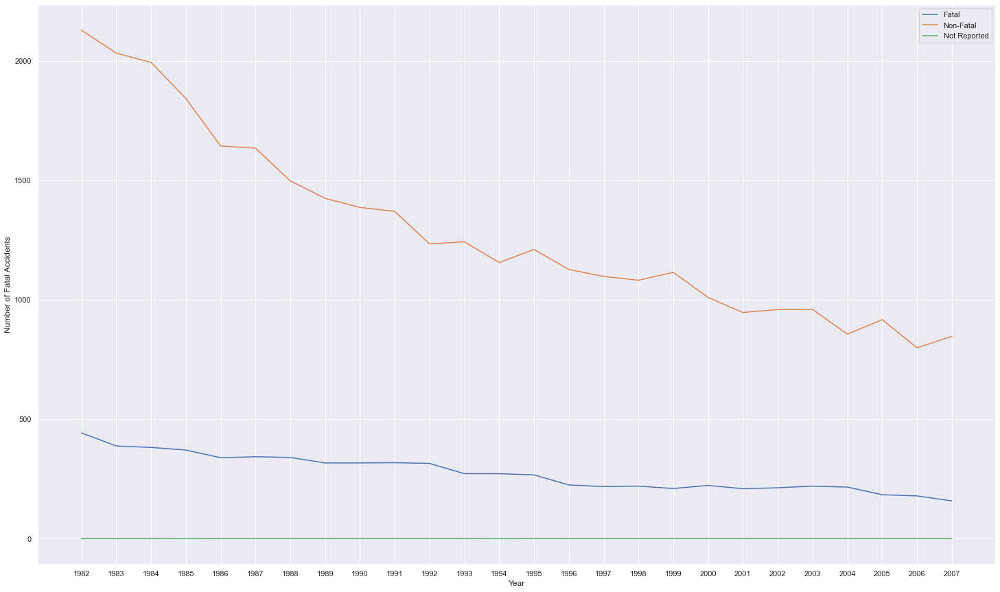

In [44]:
f = plt.figure(figsize=(25, 15))
sb.lineplot(data = df_lineAll, x = "Year", y = "Number of Fatal Accidents", label = "Fatal")
sb.lineplot(data = df_lineAll, x = "Year", y = "Number of Non-Fatal Accidents", label = "Non-Fatal")
sb.lineplot(data = df_lineAll, x = "Year", y = "Number of Not Reported Accidents", label = "Not Reported")

# Finding Correlation
### Grouping all categorical data together and find the relation

In [45]:
cat_list = ["Aircraft.damage", "Engine.Type", "Number.of.Engines", "Weather.Condition", "Broad.phase.of.flight", "Fatal.Cat"]

df_cat = df[cat_list]

df_cat

,Aircraft.damage,Engine.Type,Number.of.Engines,Weather.Condition,Broad.phase.of.flight,Fatal.Cat
0,Substantial,Reciprocating,1,VMC,Landing,Non-Fatal
1,Destroyed,Reciprocating,1,IMC,Cruise,Fatal
2,Substantial,Reciprocating,1,VMC,Climb,Non-Fatal
3,Substantial,Reciprocating,1,VMC,Approach,Non-Fatal
4,Substantial,Reciprocating,1,IMC,Descent,Non-Fatal
...,...,...,...,...,...,...
52049,Substantial,Reciprocating,1,VMC,Maneuvering,Non-Fatal
52050,Substantial,Reciprocating,1,VMC,Landing,Non-Fatal
52051,Substantial,Reciprocating,1,VMC,Landing,Non-Fatal
52052,Substantial,Reciprocating,1,VMC,Maneuvering,Non-Fatal


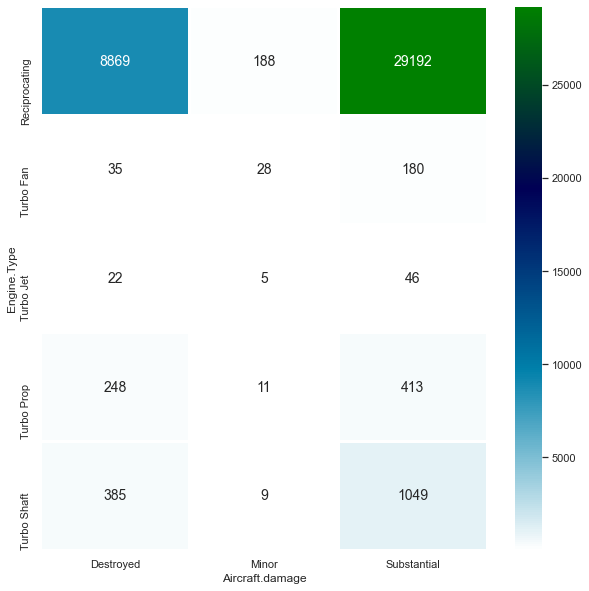

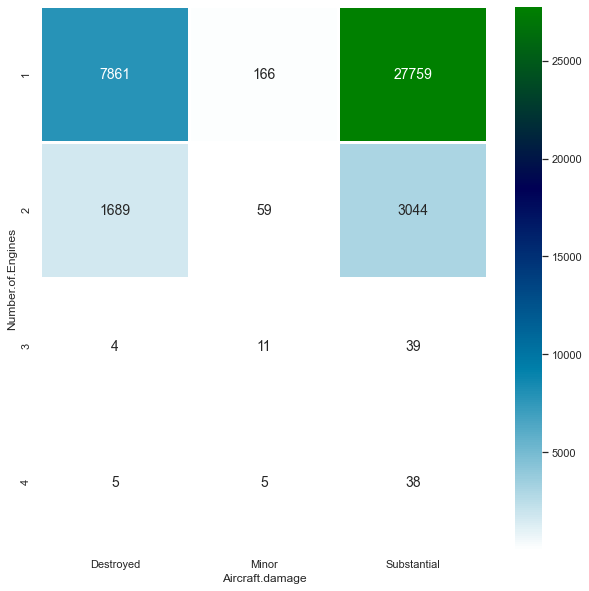

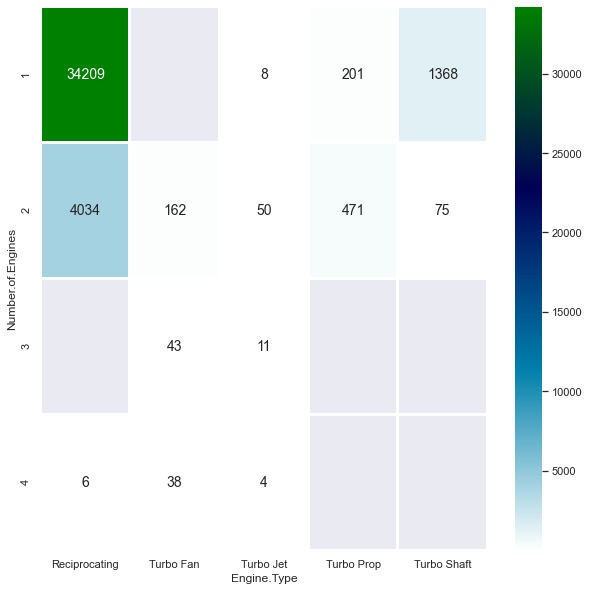

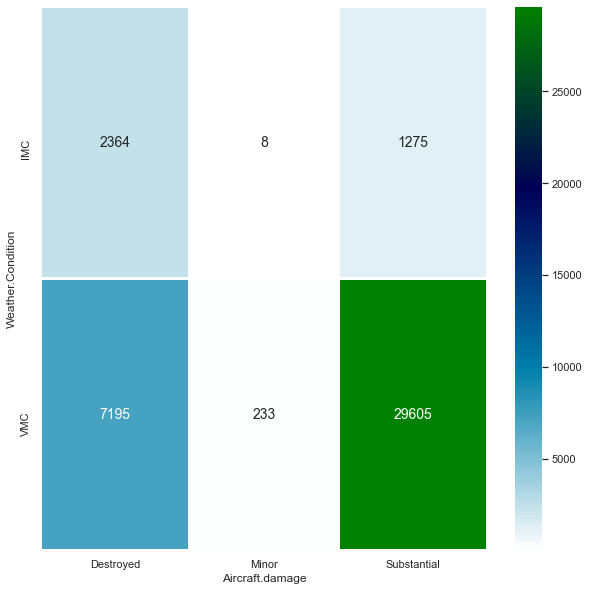

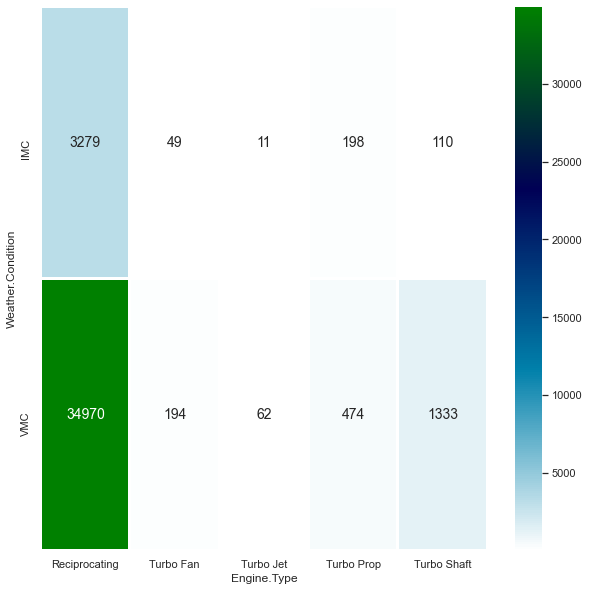

...

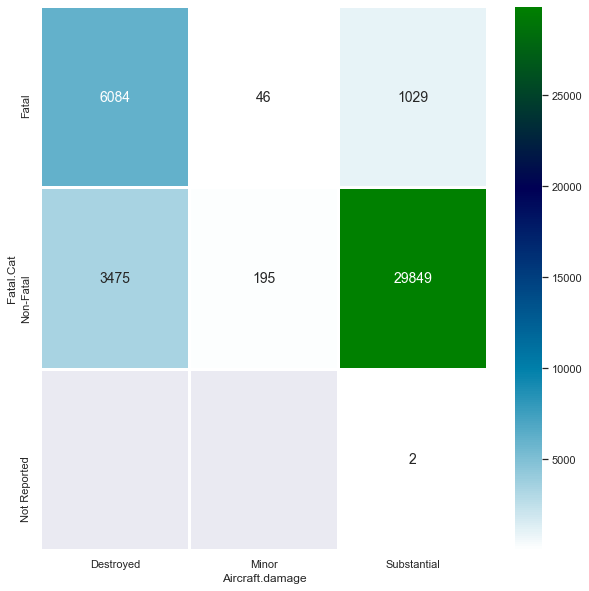

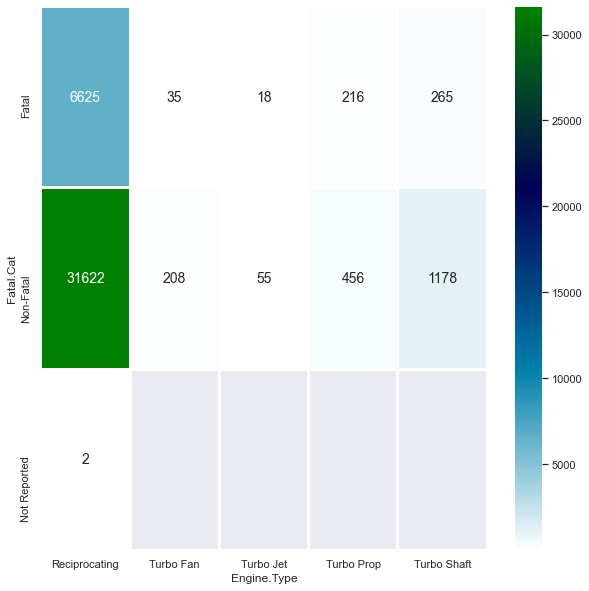

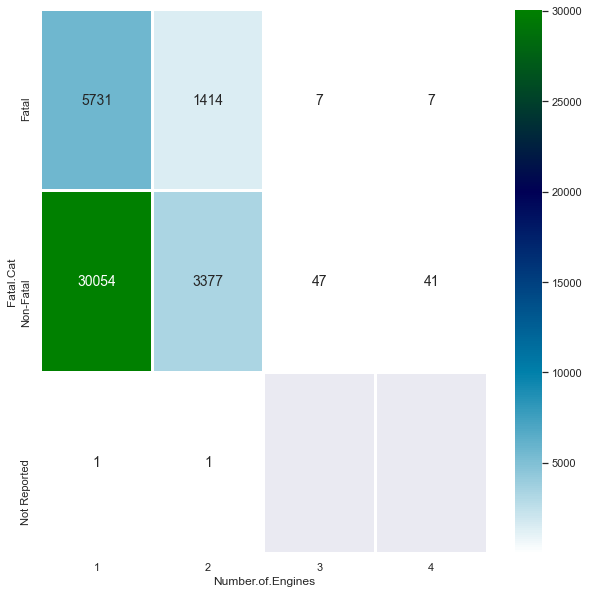

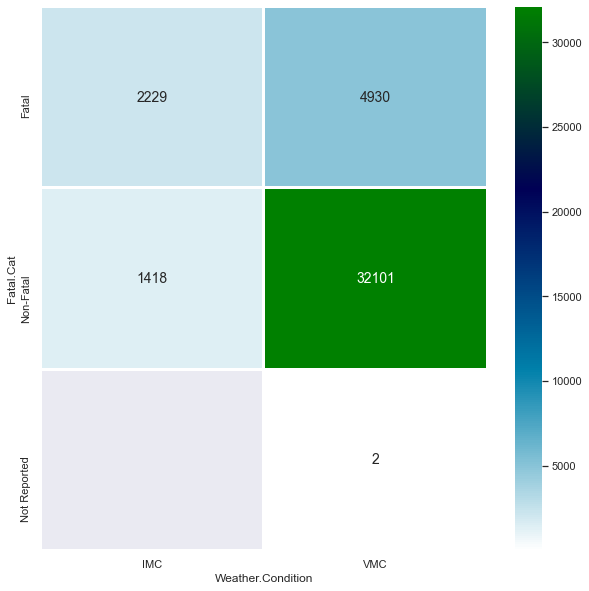

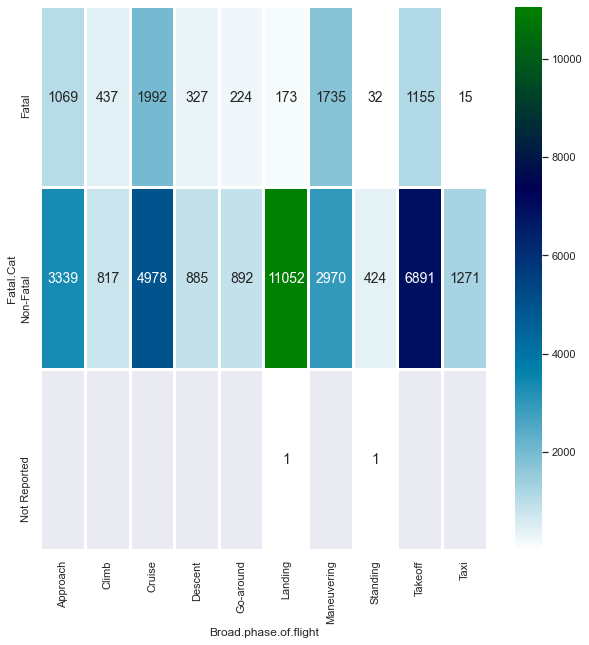

In [46]:
countCORRWITHALLVARIABLES=0
for i in range(len(df_cat.columns)):
    for j in range(len(df_cat.columns)):
        if (i == j) or (i < j):
            continue
        f = plt.figure(figsize=(10, 10))
        ax = sb.heatmap(df_cat.groupby([df_cat.columns[i], df_cat.columns[j]]).size().unstack(), linewidths = 2, annot = True, annot_kws = {"size": 14}, cmap = 'ocean_r', fmt='g')
        figure = ax.get_figure()    
        figure.savefig('Images/Correlation/ALL/Correlation Against ALLVARIABLES - %d.png'%countCORRWITHALLVARIABLES)
        countCORRWITHALLVARIABLES+=1


# Finding Correlation for each Variables
### Correlation against Fatal.Cat

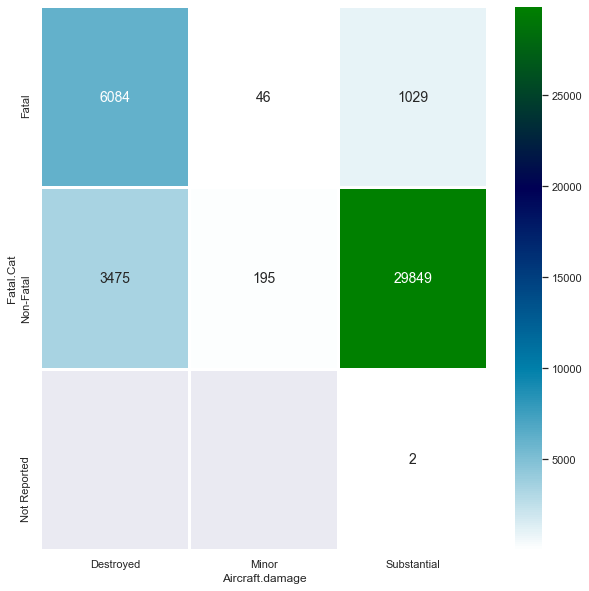

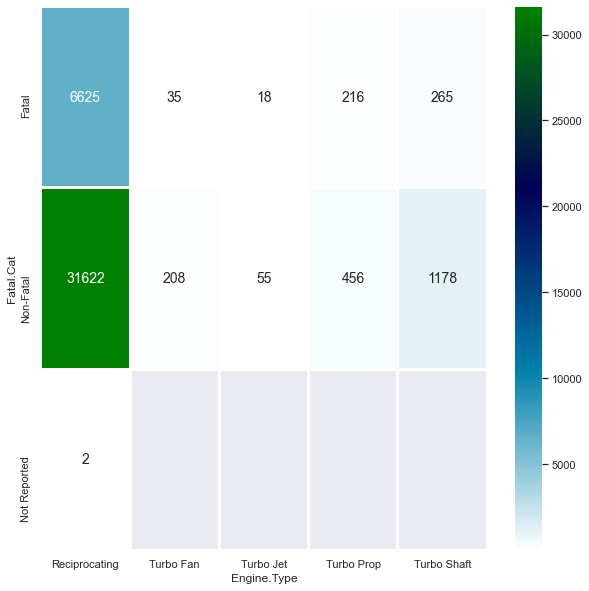

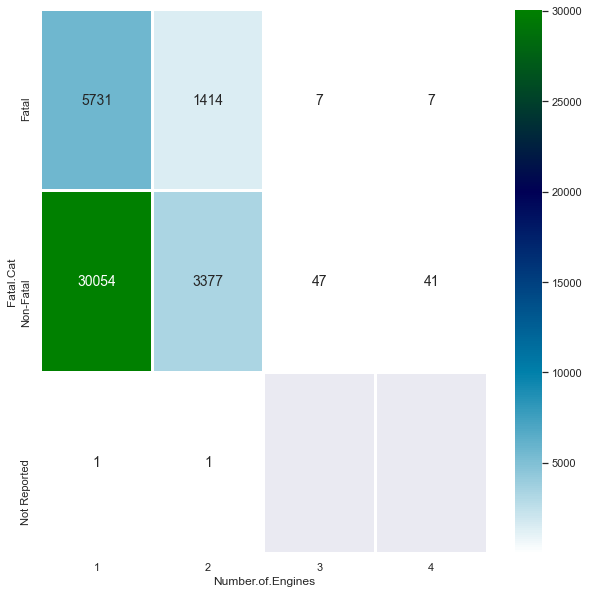

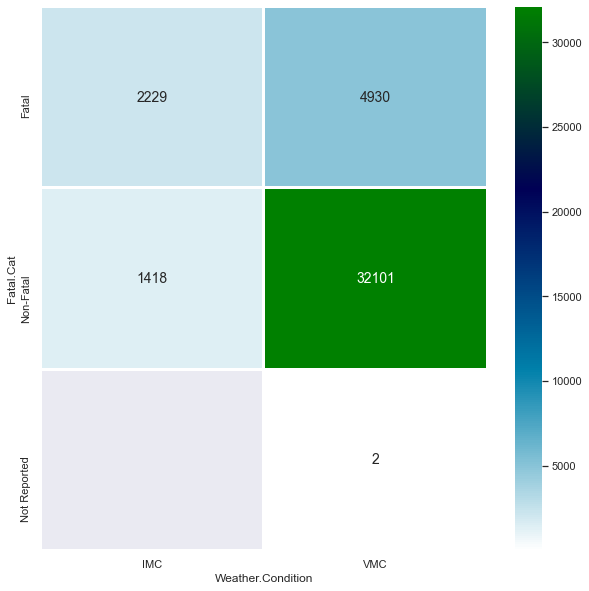

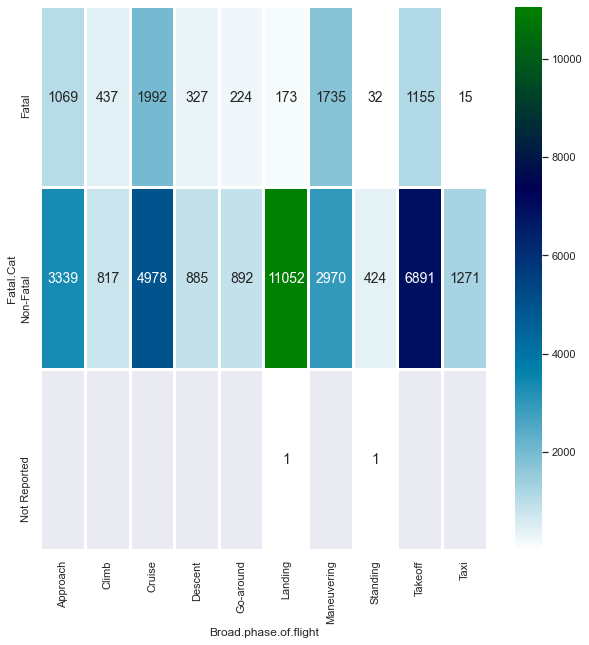

In [47]:
countCORRagainstfatCAT=0
for i in range(len(df_cat.columns)):
    if df_cat.columns[i] == "Fatal.Cat":
        continue
    f = plt.figure(figsize=(10, 10))
    ax = sb.heatmap(df_cat.groupby([df_cat["Fatal.Cat"], df_cat.columns[i]]).size().unstack(),
            linewidths = 2, annot = True, annot_kws = {"size": 14}, cmap = 'ocean_r', fmt='g')
    
    figure = ax.get_figure()    
    figure.savefig('Images/Correlation/Fatal Cat/Correlation Only FatalCat - %d.png'%countCORRagainstfatCAT)
    countCORRagainstfatCAT+=1
   

# Finding Correlation
## Fatal Results ONLY

In [48]:
df_catfat = df_cat[df_cat["Fatal.Cat"] == "Fatal"]

df_catfat.reset_index(drop = True, inplace = True)

df_catfat

,Aircraft.damage,Engine.Type,Number.of.Engines,Weather.Condition,Broad.phase.of.flight,Fatal.Cat
0,Destroyed,Reciprocating,1,IMC,Cruise,Fatal
1,Destroyed,Reciprocating,2,VMC,Takeoff,Fatal
2,Destroyed,Reciprocating,1,IMC,Maneuvering,Fatal
3,Destroyed,Reciprocating,2,IMC,Cruise,Fatal
4,Destroyed,Reciprocating,1,IMC,Cruise,Fatal
...,...,...,...,...,...,...
7154,Substantial,Reciprocating,1,VMC,Maneuvering,Fatal
7155,Destroyed,Reciprocating,1,IMC,Maneuvering,Fatal
7156,Substantial,Reciprocating,1,VMC,Approach,Fatal
7157,Destroyed,Reciprocating,1,VMC,Cruise,Fatal


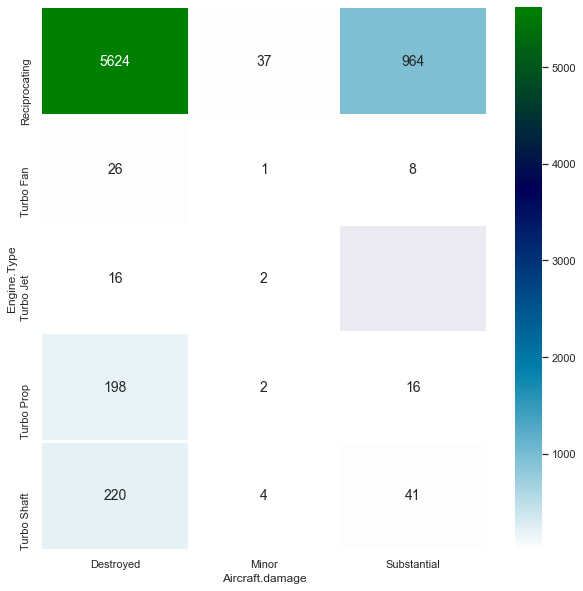

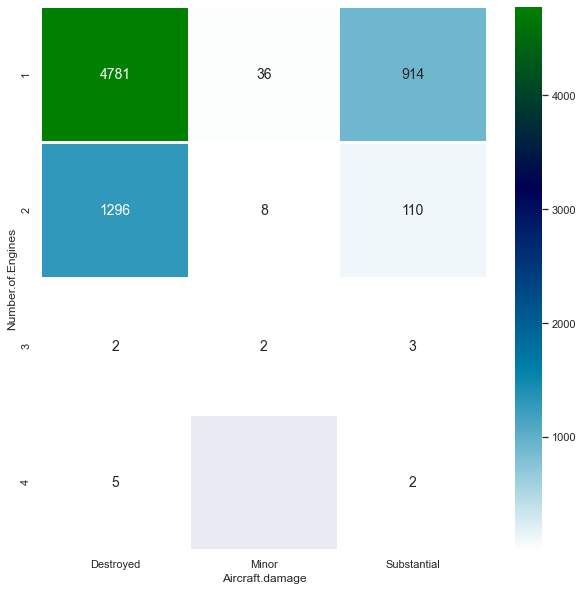

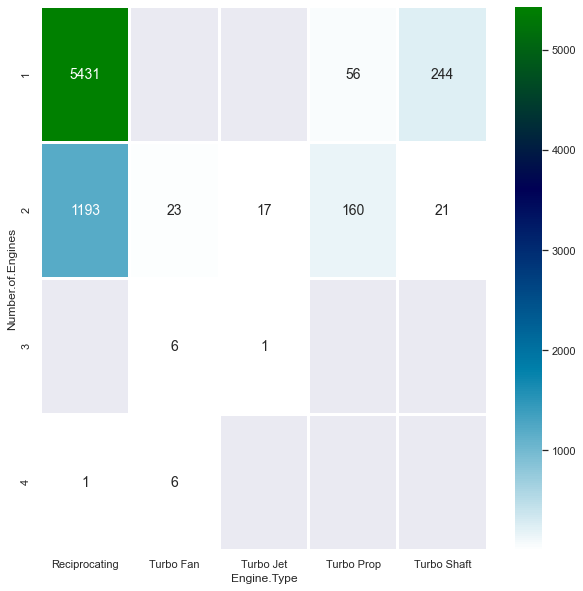

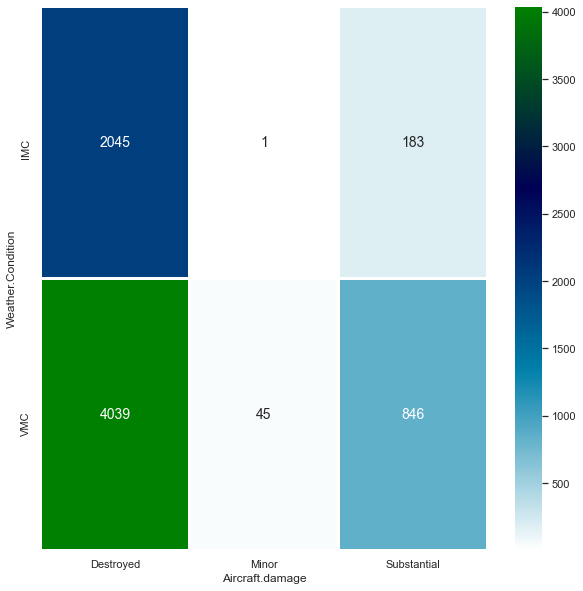

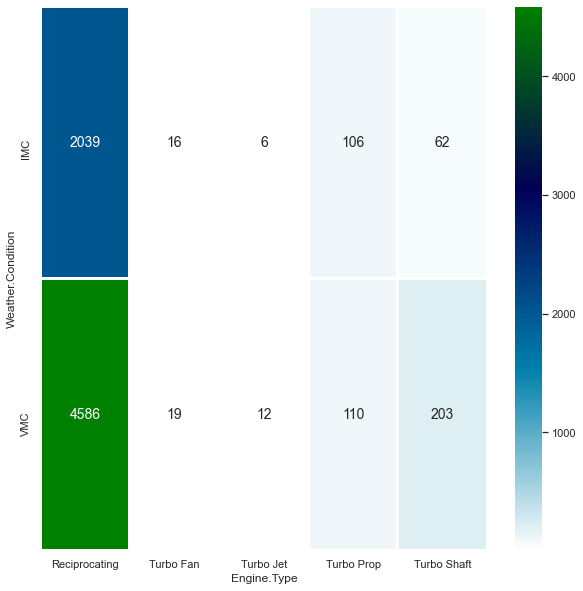

...

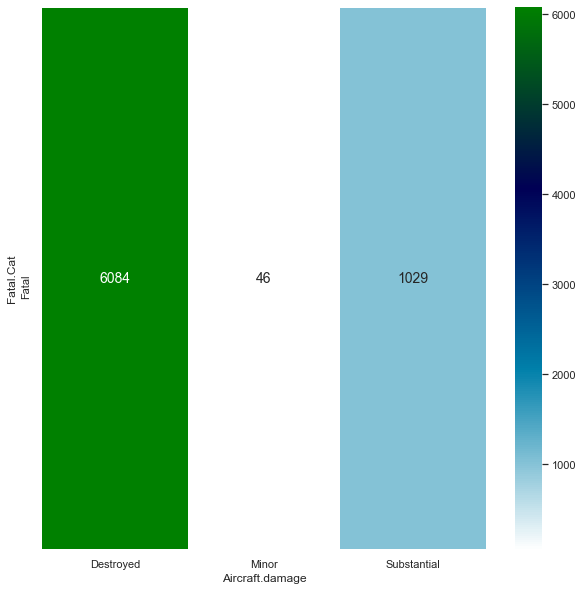

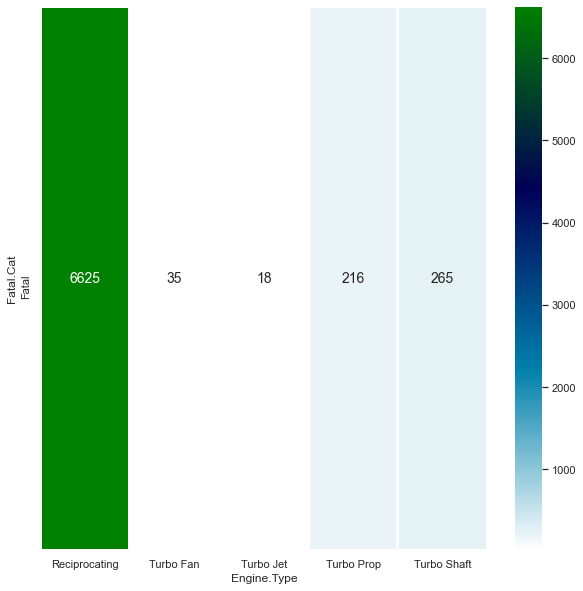

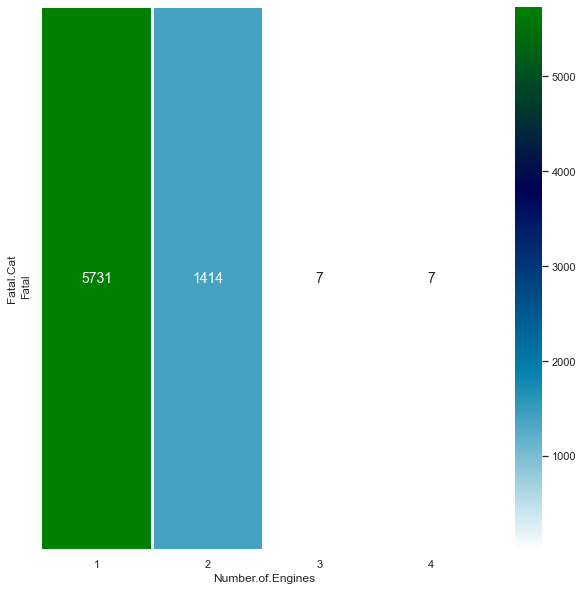

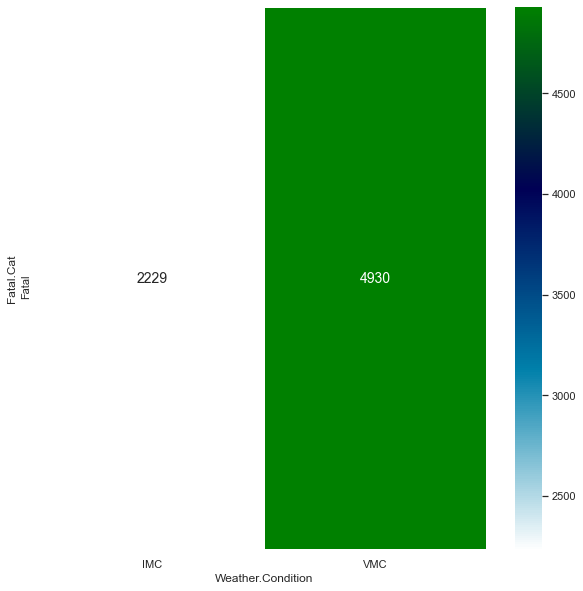

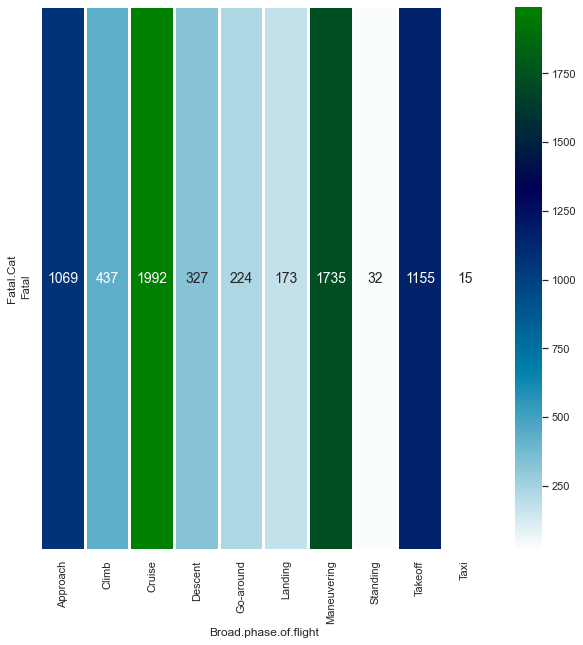

In [49]:
countONLYFATAL=0
for i in range(len(df_catfat.columns)):
    for j in range(len(df_catfat.columns)):
        if (df_catfat.columns[j] == "Fatal.Cat"):
            continue
        if (i == j) or (i < j):
            continue
        f = plt.figure(figsize=(10, 10))
        ax = sb.heatmap(df_catfat.groupby([df_catfat.columns[i], df_catfat.columns[j]]).size().unstack(),
                   linewidths = 2, annot = True, annot_kws = {"size": 14}, cmap = 'ocean_r', fmt='g')
        figure = ax.get_figure()    
        figure.savefig('Images/Correlation/Fatal ONLY/Correlation Only Fatal - %d.png'%countONLYFATAL)
        countONLYFATAL+=1
   

# Map Plot


Estimated number of clusters: 37
Estimated number of noise points: 2464


DBSCAN(eps=0.7, min_samples=10)

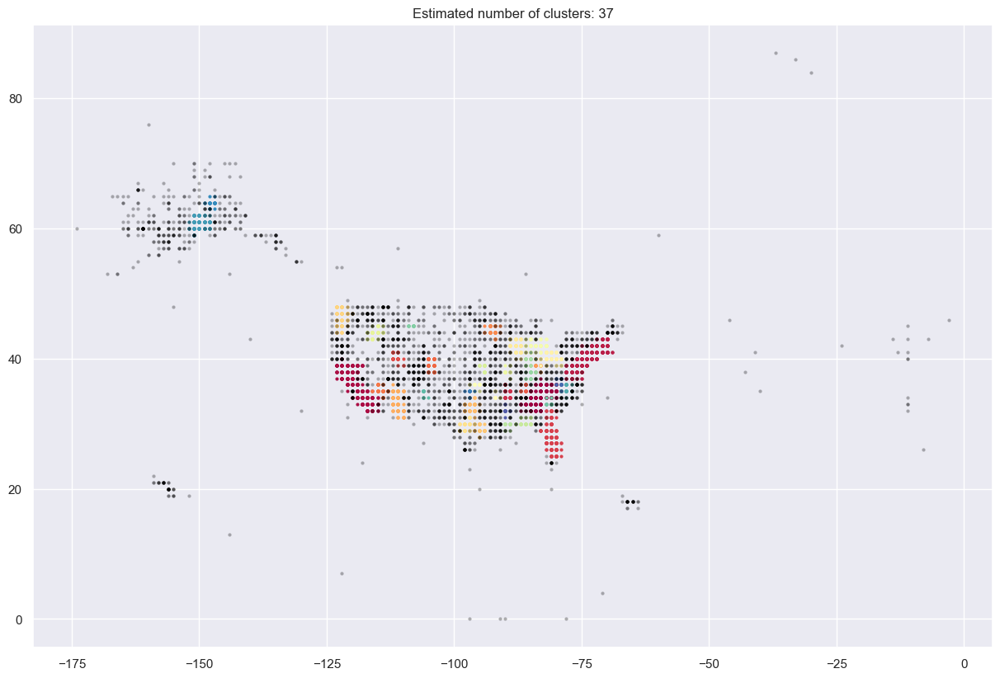

In [50]:
from sklearn.cluster import DBSCAN
from sklearn import metrics

X = pd.DataFrame(map_df[["Latitude", "Longitude"]]).dropna()
X.reset_index(drop=True,inplace=True)
X_fixed = X[(X['Longitude'].astype(float).astype(int) < 0) & (X['Latitude'].astype(float).astype(int) > -20)]
X_fixed

db = DBSCAN(eps=0.7, min_samples=10).fit(X_fixed,sample_weight=0.5)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)


display(db)
# #############################################################################
# Plot result
import matplotlib.pyplot as plt

#img = plt.imread("Map.png")


# Black removed and is used for noise instead.
unique_labels = set(labels)

colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(15, 10), dpi=100)
#plt.imshow(img, zorder=0, extent=[-180, -21, 9, 77])

for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]
        a=0.3
    else:
        a=1
    class_member_mask = (labels == k)

    xy = X_fixed[class_member_mask & core_samples_mask]
    plt.plot(xy['Longitude'].astype(float).astype(int), xy['Latitude'].astype(float).astype(int), '.', mfc=tuple(col), mec='none',alpha=a)

    xy = X_fixed[class_member_mask & ~core_samples_mask]
    plt.plot(xy['Longitude'].astype(float).astype(int), xy['Latitude'].astype(float).astype(int), '.', mfc=tuple(col), mec='none',alpha=a)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.savefig('Images/Cluster Map Plot.png')

In [51]:
import folium
from folium.plugins import MarkerCluster

airports = pd.read_csv("../Data/us-airports.csv", encoding = "ISO-8859-1")
airports.head()

subset_data = df[['Year', 'Month', 'Latitude', 'Longitude', 'Aircraft.damage', 'Aircraft.Category', 'Fatal.Cat', 'Fatal.Count']]
#subset_data.dropna(inplace=True)
subset_data['Year'] = subset_data['Year'].astype("int64")
recent = subset_data[(subset_data['Aircraft.Category'] == 'Airplane')]
map_ = folium.Map(location = [40,-90], zoom_start = 4)
marker_cluster = folium.plugins.MarkerCluster().add_to(map_)

large_airports=airports[airports['type'] == 'large_airport']

for i in range(len(large_airports)):
    lon = large_airports.iloc[i]['longitude_deg']
    lat = large_airports.iloc[i]['latitude_deg']
    name=large_airports.iloc[i]['name']
    airport_str = "Name" + str(name)
    folium.Circle(radius=1500 , location = [lat, -abs(lon)], popup = airport_str, icon = folium.Icon(color ="blue",icon='plane')).add_to(map_)        
        


for i in range(len(recent)):
    lon = recent.iloc[i]['Longitude']
    lat = recent.iloc[i]['Latitude']
    month = recent.iloc[i]['Month']
    year = recent.iloc[i]['Year']
    fatal = recent.iloc[i]['Fatal.Cat']
    damage = recent.iloc[i]['Aircraft.damage']
    count = recent.iloc[i]['Fatal.Count']
    popup_str = "Fatal Count" + str(count) +str(",") +str (lon) +str(",") +str(lat)
    if fatal == "Fatal":
        folium.Marker(location = [lat, lon], popup = popup_str, icon = folium.Icon(color ="red")).add_to(marker_cluster) 
    if fatal == "Non-Fatal":
        folium.Marker(location = [lat, lon], popup = popup_str, icon = folium.Icon(color ="blue")).add_to(marker_cluster)
map_

<ipython-input-51-5226119ac5fe>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data['Year'] = subset_data['Year'].astype("int64")


# Uni-Variate with Survivability Rate & Accident Count
Analysiing the relationship between aircraft damage and the accident rate

#### 1. Weather Condition

<AxesSubplot:>

<AxesSubplot:xlabel='VMC'>

<AxesSubplot:xlabel='IMC'>

VMC Survival Chance: 86.69 %
IMC Survival Chance: 38.88 %


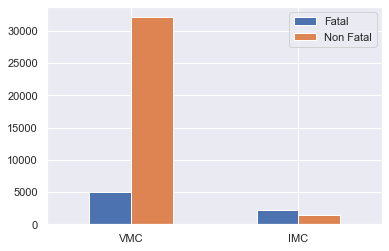

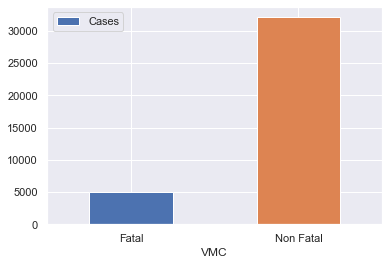

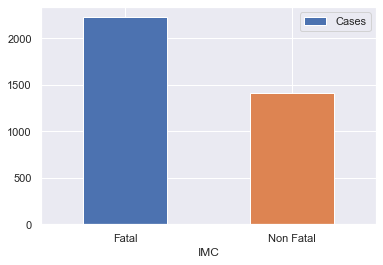

In [52]:
imc = df[df['Weather.Condition']== 'IMC']
imc_Fatal=(sum(imc["Fatal.Cat"] == 'Fatal'))
imc_Non_Fatal=(sum(imc["Fatal.Cat"] == 'Non-Fatal'))

vmc = df[df['Weather.Condition']== 'VMC']
vmc_Fatal=(sum(vmc["Fatal.Cat"] == 'Fatal'))
vmc_Non_Fatal=(sum(vmc["Fatal.Cat"] == 'Non-Fatal'))

Fatal = [vmc_Fatal,imc_Fatal]
Non_Fatal = [vmc_Non_Fatal,imc_Non_Fatal]
index = ['VMC','IMC']
df2 = pd.DataFrame({'Fatal': Fatal,
                   'Non Fatal': Non_Fatal}, index=index)
display(df2.plot.bar(rot=0))
plt.savefig('Images/Survivability Rate/Weather Condition.png')

df2 = pd.DataFrame({'VMC':['Fatal', 'Non Fatal'], 'Cases':[vmc_Fatal,vmc_Non_Fatal]})
display(df2.plot.bar(x='VMC', y='Cases', rot=0, color = ['C0','C1']))
plt.savefig('Images/Survivability Rate/Weather Condition - VMC.png')

df2 = pd.DataFrame({'IMC':['Fatal', 'Non Fatal'], 'Cases':[imc_Fatal,imc_Non_Fatal]})
display(df2.plot.bar(x='IMC', y='Cases', rot=0, color = ['C0','C1']))
plt.savefig('Images/Survivability Rate/Weather Condition - IMC.png')

print("VMC Survival Chance:",round((vmc_Non_Fatal/(vmc_Fatal+vmc_Non_Fatal)*100),2),"%")
print("IMC Survival Chance:",round((imc_Non_Fatal/(imc_Fatal+imc_Non_Fatal)*100),2),"%")



##### 2. Number of Engines

<AxesSubplot:>

<AxesSubplot:xlabel='One Engine'>

<AxesSubplot:xlabel='Two Engine'>

<AxesSubplot:xlabel='Three Engine'>

<AxesSubplot:xlabel='Four Engine'>

One Engine Survival Chance: 83.98 %
Two Engine Survival Chance: 70.49 %
Three Engine Survival Chance: 87.04 %
Four Engine Survival Chance: 85.42 %


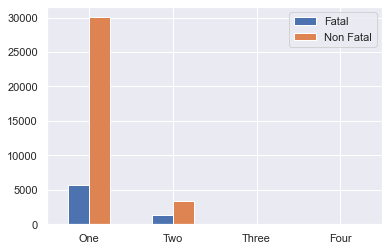

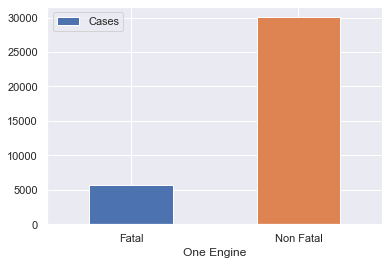

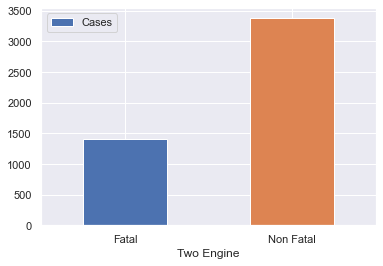

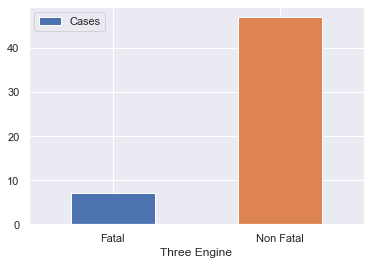

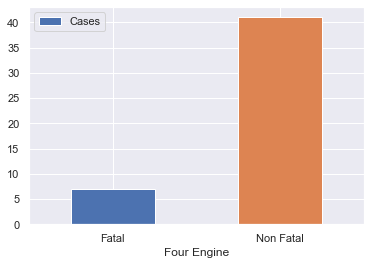

In [53]:
one = df[df['Number.of.Engines']== 1.0]
one_Fatal=(sum(one["Fatal.Cat"] == 'Fatal'))
one_Non_Fatal=(sum(one["Fatal.Cat"] == 'Non-Fatal'))

two = df[df['Number.of.Engines']== 2.0]
two_Fatal=(sum(two["Fatal.Cat"] == 'Fatal'))
two_Non_Fatal=(sum(two["Fatal.Cat"] == 'Non-Fatal'))

three = df[df['Number.of.Engines']== 3.0]
three_Fatal=(sum(three["Fatal.Cat"] == 'Fatal'))
three_Non_Fatal=(sum(three["Fatal.Cat"] == 'Non-Fatal'))

four = df[df['Number.of.Engines']== 4.0]
four_Fatal=(sum(four["Fatal.Cat"] == 'Fatal'))
four_Non_Fatal=(sum(four["Fatal.Cat"] == 'Non-Fatal'))

Fatal = [one_Fatal,two_Fatal,three_Fatal,four_Fatal]
Non_Fatal = [one_Non_Fatal,two_Non_Fatal,three_Non_Fatal,three_Non_Fatal]
index = ['One','Two','Three','Four']


df3 = pd.DataFrame({'Fatal': Fatal,
                   'Non Fatal': Non_Fatal}, index=index)
display(df3.plot.bar(rot=0))
plt.savefig('Images/Survivability Rate/No. of Engines.png')

df3 = pd.DataFrame({'One Engine':['Fatal', 'Non Fatal'], 'Cases':[one_Fatal,one_Non_Fatal]})
display(df3.plot.bar(x='One Engine', y='Cases', rot=0, color = ['C0','C1']))
plt.savefig('Images/Survivability Rate/No. of Engines - 1.png')

df3 = pd.DataFrame({'Two Engine':['Fatal', 'Non Fatal'], 'Cases':[two_Fatal,two_Non_Fatal]})
display(df3.plot.bar(x='Two Engine', y='Cases', rot=0, color = ['C0','C1']))
plt.savefig('Images/Survivability Rate/No. of Engines - 2.png')

df3 = pd.DataFrame({'Three Engine':['Fatal', 'Non Fatal'], 'Cases':[three_Fatal,three_Non_Fatal]})
display(df3.plot.bar(x='Three Engine', y='Cases', rot=0, color = ['C0','C1']))
plt.savefig('Images/Survivability Rate/No. of Engines - 3.png')

df3 = pd.DataFrame({'Four Engine':['Fatal', 'Non Fatal'], 'Cases':[four_Fatal,four_Non_Fatal]})
display(df3.plot.bar(x='Four Engine', y='Cases', rot=0, color = ['C0','C1']))
plt.savefig('Images/Survivability Rate/No. of Engines - 4.png')

print("One Engine Survival Chance:",round((one_Non_Fatal/(one_Fatal+one_Non_Fatal)*100),2),"%")
print("Two Engine Survival Chance:",round((two_Non_Fatal/(two_Fatal+two_Non_Fatal)*100),2),"%")
print("Three Engine Survival Chance:",round((three_Non_Fatal/(three_Fatal+three_Non_Fatal)*100),2),"%")
print("Four Engine Survival Chance:",round((four_Non_Fatal/(four_Fatal+four_Non_Fatal)*100),2),"%")

# Machine Learning
1. Multi-Variate Linear Regression
2. CramerV Correlation
3. Random Forest Model

In [54]:
df.head()

,Day,Month,Year,Make,Aircraft.damage,Aircraft.Category,Number.of.Engines,Engine.Type,Weather.Condition,Broad.phase.of.flight,Fatal,Injured,Uninjured,Fatal.Cat,Fatal.Count,Latitude,Longitude
0,1,1,1982,BEECH,Substantial,NaN,1,Reciprocating,VMC,Landing,0.0,0.0,1.0,Non-Fatal,0,0.0,0.0
1,2,1,1982,BEECH,Destroyed,Airplane,1,Reciprocating,IMC,Cruise,2.0,0.0,0.0,Fatal,2,0.0,0.0
2,6,1,1982,BEECH,Substantial,Airplane,1,Reciprocating,VMC,Climb,0.0,0.0,3.0,Non-Fatal,0,0.0,0.0
3,7,1,1982,BEECH,Substantial,Airplane,1,Reciprocating,VMC,Approach,0.0,0.0,1.0,Non-Fatal,0,0.0,0.0
4,12,1,1982,BEECH,Substantial,Airplane,1,Reciprocating,IMC,Descent,0.0,1.0,1.0,Non-Fatal,0,0.0,0.0


/Users/ester/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Year', ylabel='count'>

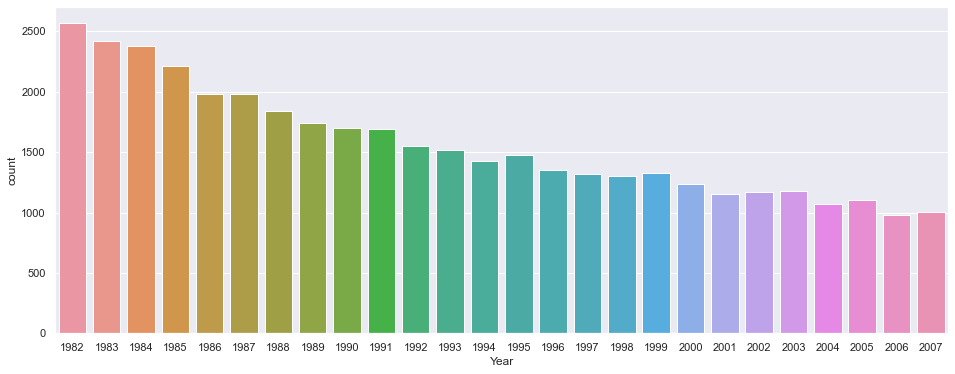

In [55]:
temp_1 = df.sort_values(by = ["Year"]).reset_index(drop = True)
plt.figure(figsize=(16, 6))
sb.countplot(temp_1["Year"])

## 1. Multi-Variate Linear Regression Model

Response Variable: **Chance of Fatality**

Predictor Variable: **Make, Aircraft Damage, Number of Engines, Engine Type, Weather Condition, Broad Phase**

Question: What's the relation between the different varirables and the fatal count for accident?

In [56]:
df.head()

,Day,Month,Year,Make,Aircraft.damage,Aircraft.Category,Number.of.Engines,Engine.Type,Weather.Condition,Broad.phase.of.flight,Fatal,Injured,Uninjured,Fatal.Cat,Fatal.Count,Latitude,Longitude
0,1,1,1982,BEECH,Substantial,NaN,1,Reciprocating,VMC,Landing,0.0,0.0,1.0,Non-Fatal,0,0.0,0.0
1,2,1,1982,BEECH,Destroyed,Airplane,1,Reciprocating,IMC,Cruise,2.0,0.0,0.0,Fatal,2,0.0,0.0
2,6,1,1982,BEECH,Substantial,Airplane,1,Reciprocating,VMC,Climb,0.0,0.0,3.0,Non-Fatal,0,0.0,0.0
3,7,1,1982,BEECH,Substantial,Airplane,1,Reciprocating,VMC,Approach,0.0,0.0,1.0,Non-Fatal,0,0.0,0.0
4,12,1,1982,BEECH,Substantial,Airplane,1,Reciprocating,IMC,Descent,0.0,1.0,1.0,Non-Fatal,0,0.0,0.0


In [57]:
df['Fatal Ratio'] = (df['Fatal'] / (df['Fatal'] + df['Injured'] + df['Uninjured']))*100
df['Fatal Ratio'] = df['Fatal Ratio'].fillna(value=0.0)
df.to_csv('Data/3. ML_LinearRegression.csv')

In [58]:
print("Data type : ", type(df))
print("Data dims : ", df.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (40680, 18)


In [59]:
print(df.dtypes)

Day                       object
Month                     object
Year                      object
Make                      object
Aircraft.damage           object
Aircraft.Category         object
Number.of.Engines          int64
Engine.Type               object
Weather.Condition         object
Broad.phase.of.flight     object
Fatal                    float64
Injured                  float64
Uninjured                float64
Fatal.Cat                 object
Fatal.Count                int64
Latitude                  object
Longitude                 object
Fatal Ratio              float64
dtype: object


In [60]:
X = pd.DataFrame(df[["Make", "Aircraft.damage", "Number.of.Engines", "Engine.Type", "Weather.Condition", "Broad.phase.of.flight"]])
## Encode Cat data --> Numerical data
X = X.replace({'BEECH': 1, 'BELL': 2, 'BELLANCA': 3, 'BOEING': 4, 'CESSNA': 5, 'GRUMMAN': 6, 'HUGHES': 7, 'MOONEY': 8, 'PIPER': 9, 'ROBINSON': 10})
X = X.replace({'Minor': 1, 'Substantial': 2, 'Destroyed': 3})
X = X.replace({'VMC': 1, 'IMC': 2})
X = X.replace({'Standing': 1, 'Taxi': 2, 'Takeoff': 3, 'Climb': 4, 'Cruise': 5, 'Descent': 6, 'Maneuvering': 7, 'Approach': 8, 'Landing': 9, 'Go-around': 10})
X = X.replace({'Reciprocating': 1, 'Turbo Fan': 2, 'Turbo Jet': 3, 'Turbo Prop': 4, 'Turbo Shaft': 5})
X.to_csv('Data/3. ML_Data (Regression).csv')


Training Features Shape:  (30510, 6)
Training Labels Shape:  (30510, 1)
Testing Features Shape:  (10170, 6)
Testing Labels Shape:  (10170, 1)
Intercept of Regression 	: b =  [-119.57818414]
Coefficients of Regression 	: a =  [[-0.05734666 48.47545704  3.36567724 -0.48733058 23.93964269 -0.27727697]]

              Predictors  Coefficients
0                   Make     -0.057347
1        Aircraft.damage     48.475457
2      Number.of.Engines      3.365677
3            Engine.Type     -0.487331
4      Weather.Condition     23.939643
5  Broad.phase.of.flight     -0.277277



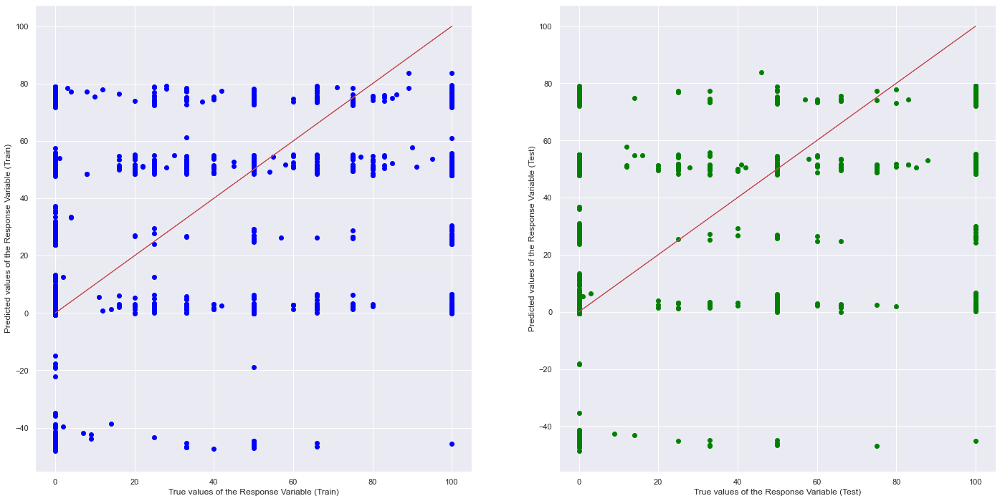

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.4694229868637355
Mean Squared Error (MSE) 	: 658.9759836399313

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.46329759044509433
Mean Squared Error (MSE) 	: 693.9038819777617



<Figure size 432x288 with 0 Axes>

In [61]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Extract Response and Predictors
df["Fatal Ratio"] = df["Fatal Ratio"].astype('int')

y = pd.DataFrame(df["Fatal Ratio"])
X = pd.DataFrame(df[["Make", "Aircraft.damage", "Number.of.Engines", "Engine.Type", "Weather.Condition", "Broad.phase.of.flight"]])

## Encode Cat data --> Numerical data
X = X.replace({'BEECH': 1, 'BELL': 2, 'BELLANCA': 3, 'BOEING': 4, 'CESSNA': 5, 'GRUMMAN': 6, 'HUGHES': 7, 'MOONEY': 8, 'PIPER': 9, 'ROBINSON': 10})
X = X.replace({'Minor': 1, 'Substantial': 2, 'Destroyed': 3})
X = X.replace({'VMC': 1, 'IMC': 2})
X = X.replace({'Standing': 1, 'Taxi': 2, 'Takeoff': 3, 'Climb': 4, 'Cruise': 5, 'Descent': 6, 'Maneuvering': 7, 'Approach': 8, 'Landing': 9, 'Go-around': 10})
X = X.replace({'Reciprocating': 1, 'Turbo Fan': 2, 'Turbo Jet': 3, 'Turbo Prop': 4, 'Turbo Shaft': 5})
X.to_csv('Data/3. ML_Data (Regression).csv')

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

print('Training Features Shape: ', X_train.shape)
print('Training Labels Shape: ', y_train.shape)
print('Testing Features Shape: ', X_test.shape)
print('Testing Labels Shape: ', y_test.shape)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Print the Coefficients against Predictors
print(pd.DataFrame(list(zip(X_train.columns, linreg.coef_[0])), columns = ["Predictors", "Coefficients"]))
print()

# Predict Response corresponding to Predictors
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'r-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")

axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'r-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()
plt.savefig('Images/LinearRegression/RatioVsVariables.png')

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

## 2. Cramer V Correlation

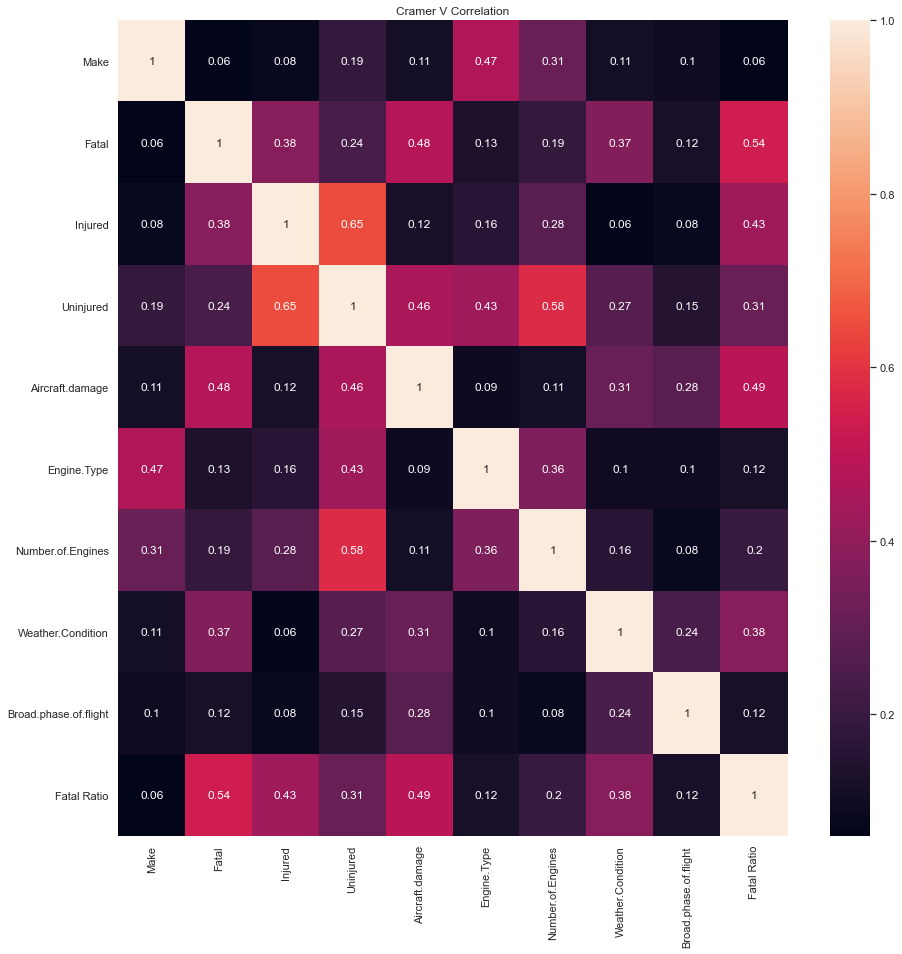

In [62]:
import itertools
import scipy.stats as ss
def cramers_v(x, y):
    cmatrix = pd.crosstab(x,y)
    chi2 = ss.chi2_contingency(cmatrix)[0]
    csum = cmatrix.sum().sum()
    phi2 = chi2/csum
    r,k = cmatrix.shape
    phi2correlation = max(0, phi2-((k-1)*(r-1))/(csum-1))
    rcorr = r-((r-1)**2)/(csum-1)
    kcorr = k-((k-1)**2)/(csum-1)
    return "%0.2f" % (np.sqrt(phi2correlation/min((kcorr-1),(rcorr-1))))

cols = ["Make","Fatal","Injured","Uninjured","Aircraft.damage","Engine.Type","Number.of.Engines","Weather.Condition","Broad.phase.of.flight", "Fatal Ratio"]
corrM = np.ones((len(cols),len(cols)))
for col1, col2 in itertools.combinations(cols, 2):
    idx1, idx2 = cols.index(col1), cols.index(col2)
    corrM[idx1, idx2] = cramers_v(df[col1], df[col2])
    corrM[idx2, idx1] = corrM[idx1, idx2]

corr = pd.DataFrame(corrM, index=cols, columns=cols)
fig, ax = plt.subplots(figsize=(15, 15))
ax = sb.heatmap(corr, annot=True, ax=ax); ax.set_title("Cramer V Correlation");

plt.savefig('Images/CramerV/Correlation Chart.png')

## 3. Multi-Variate Random Forest Classifier
Response Variable : **Fatal.Cat**     
Predictor Feature : **Make, Aircraft Damage, Number of Engines, Engine Type, Weather Condition, Broad Phase**      

In [63]:
df

,Day,Month,Year,Make,Aircraft.damage,Aircraft.Category,Number.of.Engines,Engine.Type,Weather.Condition,Broad.phase.of.flight,Fatal,Injured,Uninjured,Fatal.Cat,Fatal.Count,Latitude,Longitude,Fatal Ratio
0,1,1,1982,BEECH,Substantial,NaN,1,Reciprocating,VMC,Landing,0.0,0.0,1.0,Non-Fatal,0,0.0,0.0,0
1,2,1,1982,BEECH,Destroyed,Airplane,1,Reciprocating,IMC,Cruise,2.0,0.0,0.0,Fatal,2,0.0,0.0,100
2,6,1,1982,BEECH,Substantial,Airplane,1,Reciprocating,VMC,Climb,0.0,0.0,3.0,Non-Fatal,0,0.0,0.0,0
3,7,1,1982,BEECH,Substantial,Airplane,1,Reciprocating,VMC,Approach,0.0,0.0,1.0,Non-Fatal,0,0.0,0.0,0
4,12,1,1982,BEECH,Substantial,Airplane,1,Reciprocating,IMC,Descent,0.0,1.0,1.0,Non-Fatal,0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52049,29,10,2007,ROBINSON,Substantial,Helicopter,1,Reciprocating,VMC,Maneuvering,0.0,0.0,1.0,Non-Fatal,0,53.353333,-168.24,0
52050,3,11,2007,ROBINSON,Substantial,Helicopter,1,Reciprocating,VMC,Landing,0.0,0.0,2.0,Non-Fatal,0,43.778889,-116.938611,0
52051,20,11,2007,ROBINSON,Substantial,Helicopter,1,Reciprocating,VMC,Landing,0.0,1.0,1.0,Non-Fatal,0,33.039166,-116.915,0
52052,24,11,2007,ROBINSON,Substantial,Helicopter,1,Reciprocating,VMC,Maneuvering,0.0,0.0,1.0,Non-Fatal,0,36.88,-76.214167,0


In [64]:
df = df[df["Fatal.Cat"] != 'Not Reported']
print(df["Fatal.Cat"].value_counts())

Non-Fatal    33519
Fatal         7159
Name: Fatal.Cat, dtype: int64


In [65]:
# Extract Response and Predictors
y = pd.DataFrame(df["Fatal.Cat"])


X = pd.DataFrame(df[["Make", "Aircraft.damage", "Number.of.Engines", "Engine.Type", "Weather.Condition", "Broad.phase.of.flight"]])

## Encode Cat data --> Numerical data
X = X.replace({'BEECH': 1, 'BELL': 2, 'BELLANCA': 3, 'BOEING': 4, 'CESSNA': 5, 'GRUMMAN': 6, 'HUGHES': 7, 'MOONEY': 8, 'PIPER': 9, 'ROBINSON': 10})
X = X.replace({'Minor': 1, 'Substantial': 2, 'Destroyed': 3})
X = X.replace({'VMC': 1, 'IMC': 2})
X = X.replace({'Standing': 1, 'Taxi': 2, 'Takeoff': 3, 'Climb': 4, 'Cruise': 5, 'Descent': 6, 'Maneuvering': 7, 'Approach': 8, 'Landing': 9, 'Go-around': 10})
X = X.replace({'Reciprocating': 1, 'Turbo Fan': 2, 'Turbo Jet': 3, 'Turbo Prop': 4, 'Turbo Shaft': 5})
X.to_csv('Data/3. ML_Data (RandomForest).csv')

# Import train_test_split from sklearn
from sklearn.model_selection import train_test_split

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Check the sample sizes
print("Train Set :", y_train.shape, X_train.shape)
print("Test Set  :", y_test.shape, X_test.shape)

Train Set : (30508, 1) (30508, 6)
Test Set  : (10170, 1) (10170, 6)


#### Basic Exploration

Perform basic statistical exploration and visualization on the Train Set.

Non-Fatal    25122
Fatal         5386
Name: Fatal.Cat, dtype: int64


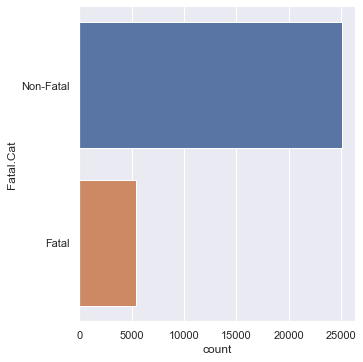

In [66]:
# Summary Statistics for Response
print(y_train["Fatal.Cat"].value_counts())

# Draw the distribution of Response
sb.catplot(y = "Fatal.Cat", data = y_train, kind = "count")

In [67]:
# # Draw the distributions of all Predictors
# f, axes = plt.subplots(6, 3, figsize=(24, 24))

# count = 0
# for var in X_train:
#     sb.boxplot(data = X_train[var], orient = "h", ax = axes[count,0])
#     sb.histplot(data = X_train[var], ax = axes[count,1])
#     sb.violinplot(data = X_train[var], orient = "h", ax = axes[count,2])
#     count += 1
    

## Random Forest Classifier in Scikit-Learn

In [68]:
# Import RandomForestClassifier model from Scikit-Learn
from sklearn.ensemble import RandomForestClassifier

# Create the Random Forest object
rforest = RandomForestClassifier(n_estimators = 100,  # n_estimators denote number of trees
                                 max_depth = 4)       # set the maximum depth of each tree

# Fit Random Forest on Train Data
rforest.fit(X_train, y_train)

<ipython-input-68-c5c1278c5f61>:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rforest.fit(X_train, y_train)


RandomForestClassifier(max_depth=4)

## Goodness of Fit of the Model

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9017962501638914

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9022615535889872



<AxesSubplot:>

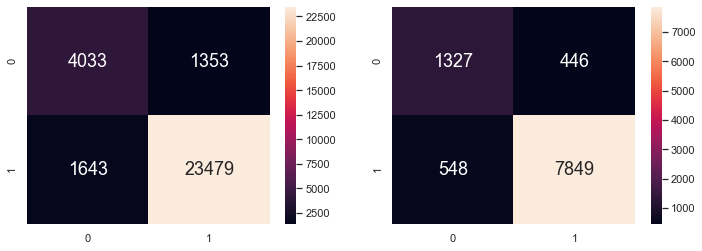

In [69]:
# Import confusion_matrix from Scikit-Learn
from sklearn.metrics import confusion_matrix

# Predict Legendary values corresponding to Total
y_train_pred = rforest.predict(X_train)
y_test_pred = rforest.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", rforest.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", rforest.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

In [70]:
from sklearn.preprocessing import LabelEncoder
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
import graphviz

number = LabelEncoder()

X = pd.DataFrame(df[["Make", "Aircraft.damage", "Number.of.Engines", "Engine.Type", "Weather.Condition", "Broad.phase.of.flight"]])

## Encode Cat data --> Numerical data
X = X.replace({'BEECH': 1, 'BELL': 2, 'BELLANCA': 3, 'BOEING': 4, 'CESSNA': 5, 'GRUMMAN': 6, 'HUGHES': 7, 'MOONEY': 8, 'PIPER': 9, 'ROBINSON': 10})
X = X.replace({'Minor': 1, 'Substantial': 2, 'Destroyed': 3})
X = X.replace({'VMC': 1, 'IMC': 2})
X = X.replace({'Standing': 1, 'Taxi': 2, 'Takeoff': 3, 'Climb': 4, 'Cruise': 5, 'Descent': 6, 'Maneuvering': 7, 'Approach': 8, 'Landing': 9, 'Go-around': 10})
X = X.replace({'Reciprocating': 1, 'Turbo Fan': 2, 'Turbo Jet': 3, 'Turbo Prop': 4, 'Turbo Shaft': 5})

Y = pd.DataFrame(df["Fatal.Cat"])

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 20)

dectree = DecisionTreeClassifier(max_depth = 4)  # create the decision tree object

dectree.fit(X_train, Y_train)                 # train the decision tree model

# Predict Response corresponding to X
Y_train_pred = dectree.predict(X_train)
Y_test_pred = dectree.predict(X_test)

# Plot the trained Decision Tree
f = plt.figure(figsize=(30,30))


dot_data = tree.export_graphviz(dectree, filled=True, 
          feature_names = X_train.columns, 
          class_names=['Fatal', 'Non-Fatal'])

graph = graphviz.Source(dot_data, format="svg") 
graph

graph.render('images/RandomForest/dtree_render',view=True) 


# # Model (can also use single decision tree)
# from sklearn.ensemble import RandomForestClassifier
# model = RandomForestClassifier(n_estimators=10)

# # Train
# model.fit(X_train, Y_train)
# # Extract single tree
# estimator = model.estimators_[5]

# from sklearn.tree import export_graphviz
# # Export as dot file
# export_graphviz(estimator, out_file='tree.dot', 
#                 feature_names = X_train.columns,
#                 class_names = ['Fatal', 'Non-Fatal'],
#                 rounded = True, proportion = False, 
#                 precision = 2, filled = True)

# # Convert to png using system command (requires Graphviz)
# from subprocess import call
# call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# # Display in jupyter notebook
# from IPython.display import Image
# Image(filename = 'tree.png')

'images/RandomForest/dtree_render.svg'

<Figure size 2160x2160 with 0 Axes>